# Panfetal B1 
# 27 Mar 2022 Chenqu

In [1]:
import numpy as np
import scipy as sp
import scanpy as sc
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import rc
from matplotlib import colors
import seaborn as sb
from itertools import compress
import random
import scirpy as ir

sc.settings.set_figure_params(dpi = 160, color_map = 'RdYlBu_r', dpi_save = 300, format = 'pdf')
plt.rcParams["figure.figsize"] = [6,6]

In [2]:
import rpy2
%load_ext rpy2.ipython

In [3]:
sb.set_palette('tab10')

In [4]:
# import utils (in github folder src/utils/)
import sys
sys.path.append('/home/jovyan/Pan_fetal_immune/src/utils/')
from array_operations import *
from colors import *

In [5]:
organ_order = ['YS','LI','BM','TH','SP','MLN','SK','GU','KI']
organ_name_order = ['Yolk Sac','Liver','Bone Marrow','Thymus','Spleen','Mesenteric Lymph Node','Skin','Gut','Kidney']

In [6]:
# set working directory
%cd /home/jovyan/panfetal/

/home/jovyan/panfetal


In [7]:
# figure directory
fig_path = '/home/jovyan/mount/gdrive/Pan_fetal/plots_output/chenqu_jhub/'
sc.settings.figdir = fig_path

# Load data

Processed datasets in h5ad format are available at https://developmentcellatlas.cellgeni.sanger.ac.uk/fetal-immune.

In [7]:
adata = sc.read('/nfs/team205/ed6/data/Fetal_immune/PAN.A01.v01.entire_data_normalised_log.20210429.LYMPHOID.embedding.h5ad')

Only considering the two last: ['.embedding', '.h5ad'].
Only considering the two last: ['.embedding', '.h5ad'].


In [8]:
adata.raw = adata.copy()

### exclude maternal contaminants

In [9]:
# in github folder metadata/souporcell_results/
maternal_barcodes = pd.read_csv('souporcell/maternal_barcodes.csv')

In [10]:
maternal_barcodes['barcodes'] = [barcode.split('-')[0]+'-'+barcode.split('-')[1] for barcode in maternal_barcodes['x']]

In [11]:
print(sum(adata.obs_names.isin(maternal_barcodes['barcodes'])))
adata = adata[~adata.obs_names.isin(maternal_barcodes['barcodes'])]

2252


### update annotation with anno_lvl_2_final_clean

In [12]:
obs = pd.read_csv('/nfs/team205/ed6/data/Fetal_immune/PAN.A01.v01.entire_data_normalised_log.20210429.full_obs.annotated.clean.csv', index_col = 0) # final annotations and removed maternal contaminant cells

/home/jovyan/my-conda-envs/skeleton/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning: Columns (6) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [13]:
for col in obs:
    adata.obs[col] = obs[col] # use anno_lvl_2_final_clean

Trying to set attribute `.obs` of view, copying.


In [14]:
adata.write_h5ad('write/lymphoid_final.h5ad')

... storing 'file' as categorical
... storing 'predicted_doublets' as categorical
... storing 'name' as categorical
... storing 'uniform_label' as categorical
... storing 'uniform_label_expanded_merged' as categorical
... storing 'uniform_label_lvl0' as categorical
... storing 'organ' as categorical
... storing 'Sample.lanes' as categorical
... storing 'Sort_id' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical
... storing 'sex' as categorical
... storing 'Processing_method' as categorical
... storing 'AnnatomicalPart' as categorical
... storing 'Sample' as categorical
... storing 'anno_lvl_2_final_clean' as categorical


In [8]:
adata= sc.read('write/lymphoid_final.h5ad')

KeyboardInterrupt: 

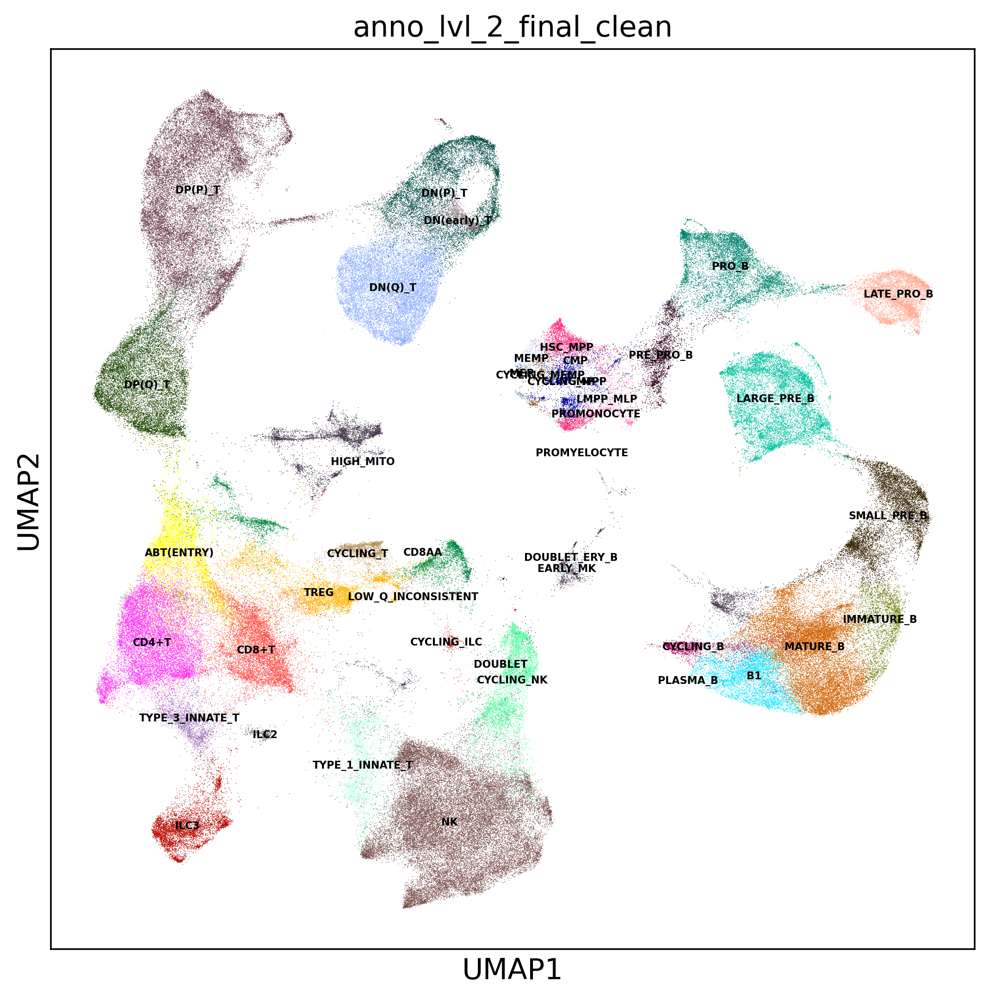

In [16]:
plt.rcParams["figure.figsize"] = [8,8]
sc.pl.umap(adata,color=['anno_lvl_2_final_clean'],legend_loc='on data',legend_fontsize=5)

# Overall UMAP

In [17]:
B = adata[adata.obs['anno_lvl_2_final_clean'].isin(['IMMATURE_B','MATURE_B','CYCLING_B','B1','PLASMA_B'])]

In [18]:
B.obs['anno_lvl_2_final_clean'] = B.obs['anno_lvl_2_final_clean'].cat.reorder_categories(['IMMATURE_B','MATURE_B','B1',  'PLASMA_B','CYCLING_B'])

Trying to set attribute `.obs` of view, copying.


In [19]:
a = B.obsm['X_umap'][:,0] > 9
b = B.obsm['X_umap'][:,1] < 3
selectlist = [a and b for a,b in zip(a,b)]
B_plot = B[selectlist].copy()

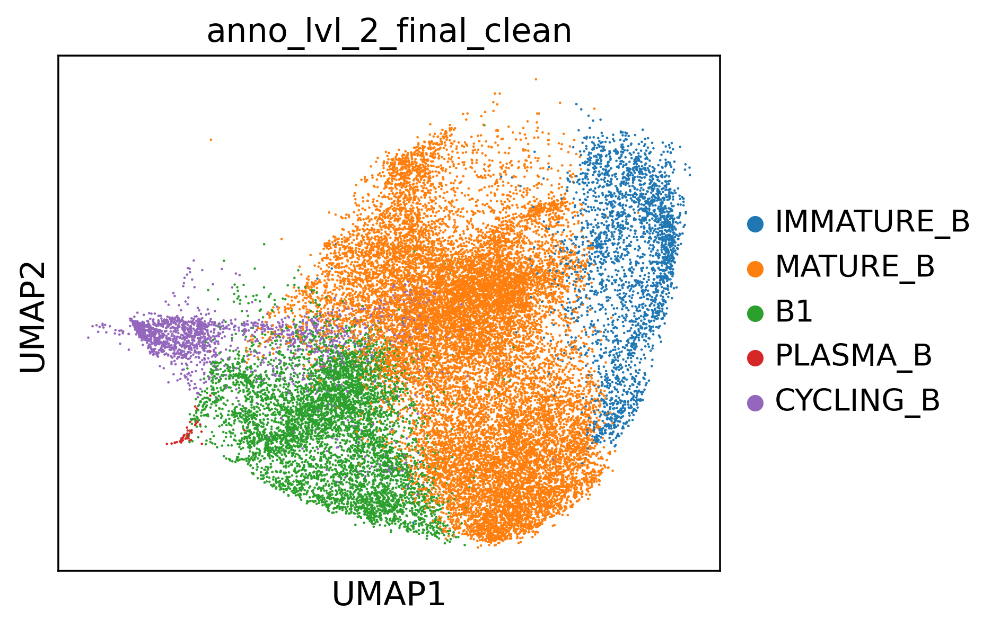

In [23]:
plt.rcParams["figure.figsize"] = [5,4]
sc.pl.umap(B_plot, color=['anno_lvl_2_final_clean'], save= 'Fig4_B1_matureBumap.pdf',palette = vega_20_scanpy)

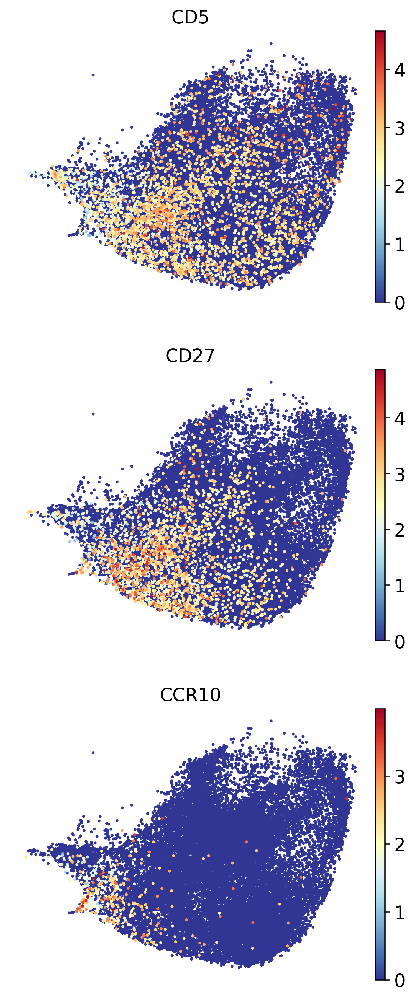

In [24]:
plt.rcParams["figure.figsize"] = [4.5,4]
genes = ['CD5','CD27','CCR10']
sc.pl.umap(B_plot,color=genes,legend_loc ='right margin',frameon=False,ncols=1,size=20,save='Fig4_B1_marker_genes.pdf')

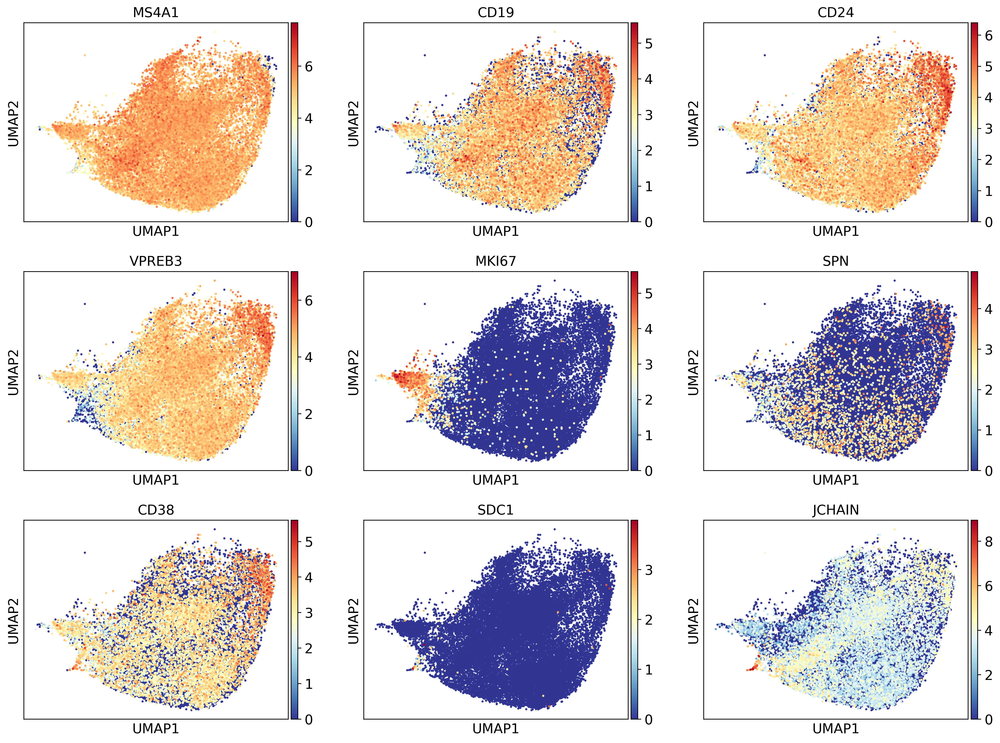

In [25]:
plt.rcParams["figure.figsize"] = [5,4]
genes = ['MS4A1','CD19','CD24','VPREB3','MKI67',
         'SPN',
         'CD38','SDC1','JCHAIN']
sc.pl.umap(B_plot,color=genes,legend_loc ='right margin',ncols=3,size=20,save='Fig4_all_other_marker_genes.pdf')

# Fraction of different mature B cells across organ/age

In [27]:
obs['donor_organ_sort']=np.char.array(obs['donor'],unicode=True)+'_'+np.char.array(obs['organ'],unicode=True)+'_'+np.char.array(obs['Sort_id'],unicode=True)

In [28]:
counter_tot = Counter(obs['donor_organ_sort'])

In [29]:
matureB = adata[adata.obs['anno_lvl_2_final_clean'].isin(['B1','CYCLING_B','MATURE_B','PLASMA_B'])]

In [30]:
adata_select = matureB[matureB.obs['Sort_id'].isin(['CD45N','CD45P','TOT'])]

In [31]:
adata_select.obs['donor_organ']=np.char.array(adata_select.obs['donor'],unicode=True)+'_'+np.char.array(adata_select.obs['organ'],unicode=True)
adata_select.obs['donor_organ_sort']=np.char.array(adata_select.obs['donor_organ'],unicode=True)+'_'+np.char.array(adata_select.obs['Sort_id'],unicode=True)
adata_select.obs['donor_organ']=adata_select.obs['donor_organ'].astype('category')
adata_select.obs['donor_organ_sort'] = adata_select.obs['donor_organ_sort'].astype('category')

Trying to set attribute `.obs` of view, copying.


In [32]:
sort_fraction = pd.read_csv('metadata/220621_FACs_gating_proportions_correct.csv')

In [33]:
adata_select.obs['sort_fraction'] = lookup(adata_select.obs['file'], sort_fraction, 'Sample.lanes','parent_Multiplier')

In [34]:
### group by donor_organ_sort

In [35]:
cc1 = pd.DataFrame(index =list(adata_select.obs['donor_organ_sort'].cat.categories), columns = list(adata_select.obs['anno_lvl_2_final_clean'].cat.categories)+['total'])

In [36]:
for donor_organ_sort in cc1.index:
    counter = Counter(adata_select[adata_select.obs['donor_organ_sort']==donor_organ_sort].obs['anno_lvl_2_final_clean'])
    cc1.loc[donor_organ_sort,'total']=counter_tot[donor_organ_sort]
    for cell in cc1.columns[:-1]:
        cc1.loc[donor_organ_sort,cell] = counter[cell]
    #cluster_counter.loc['B1%',sample]=counterB1[sample] / counterB[sample]
cc1 = cc1.astype('int64')

In [37]:
cc1['sort'] = [str(a).split('_')[-1] for a in cc1.index]
cc1['age'] = lookup(cc1.index, adata_select.obs, 'donor_organ_sort', 'age').astype('int64')
cc1['donor_organ'] = ['_'.join(str(a).split('_')[:-1]) for a in cc1.index]
cc1['sort_fraction'] = lookup(cc1.index, adata_select.obs, 'donor_organ_sort', 'sort_fraction')
cc1.loc[cc1['sort_fraction'].isna(), 'sort_fraction'] = 1
cc1['B1_weighted'] = cc1['B1'] * cc1['sort_fraction']
cc1['B2_weighted'] = cc1['MATURE_B'] * cc1['sort_fraction']

In [38]:
cc2 = cc1.groupby('donor_organ').agg('sum')
cc2['B1/B2 ratio'] = cc2['B1_weighted'] / cc2['B2_weighted']
cc2['age'] = lookup(cc2.index, adata_select.obs, 'donor_organ', 'age').astype('int64')
cc2['organ'] = [str(a).split('_')[1] for a in cc2.index]
cc2['B1B2'] = cc2['B1'] + cc2['MATURE_B']
bin_names = np.array(['7-9 pcw', '10-12 pcw', '13-15 pcw', '16-17 pcw']) # bin ages 
cc2['age_bin'] = bin_names[np.digitize(cc2['age'], [10, 13, 16])]
cc2['age_bin'] = cc2['age_bin'].astype('category').cat.reorder_categories(bin_names)
cc2['age_organ'] = cc2['age_bin'].astype('str') + '_' + cc2['organ'].astype('str')
cc2['weighted_raito'] = cc2['B1/B2 ratio'] * cc2['B1B2']
cc2 = cc2.loc[cc2['B1B2'] >=5, :]

In [39]:
tmp = cc2.groupby(['age_organ']).agg('sum')
cc3 = cc2.groupby(['age_organ']).first()
cc3['B1/B2 ratio'] = tmp['weighted_raito'] / tmp['B1B2']
cc3 = cc3.loc[:, ['B1/B2 ratio', 'B1B2', 'age_bin', 'age']]
cc3['organ'] = [str(a).split('_')[1] for a in cc3.index]
cc3['log ratio'] = np.log2(cc3['B1/B2 ratio'])
cc3['log count'] = np.log10(cc3['B1B2'])

In [40]:
cc3

,B1/B2 ratio,B1B2,age_bin,age,organ,log ratio,log count
age_organ,,,,,,,
10-12 pcw_BM,0.161290,36,10-12 pcw,12,BM,-2.632268,1.556303
10-12 pcw_KI,0.244817,6,10-12 pcw,12,KI,-2.030226,0.778151
10-12 pcw_LI,0.486715,32,10-12 pcw,11,LI,-1.038850,1.505150
10-12 pcw_SK,0.163986,122,10-12 pcw,12,SK,-2.608351,2.086360
10-12 pcw_SP,0.433621,107,10-12 pcw,11,SP,-1.205492,2.029384
10-12 pcw_TH,1.610500,6,10-12 pcw,11,TH,0.687509,0.778151
13-15 pcw_BM,0.162443,43,13-15 pcw,14,BM,-2.621995,1.633468
13-15 pcw_GU,0.271429,89,13-15 pcw,15,GU,-1.881356,1.949390
13-15 pcw_LI,0.389299,281,13-15 pcw,14,LI,-1.361050,2.448706


In [41]:
cc3['organ']=cc3['organ'].astype('category')
cc3['organ']=cc3['organ'].cat.set_categories(organ_order).cat.remove_unused_categories()
cc3['organ'] = cc3['organ'].cat.rename_categories(['Liver', 'Bone Marrow', 'Thymus', 'Spleen', 'Skin', 'Gut', 'Kidney'])
organ_color_map = dict(zip(organ_name_order, np.array(sb.color_palette('tab10'))[range(len(organ_order))]))

/home/jovyan/my-conda-envs/skeleton/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/jovyan/my-conda-envs/skeleton/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


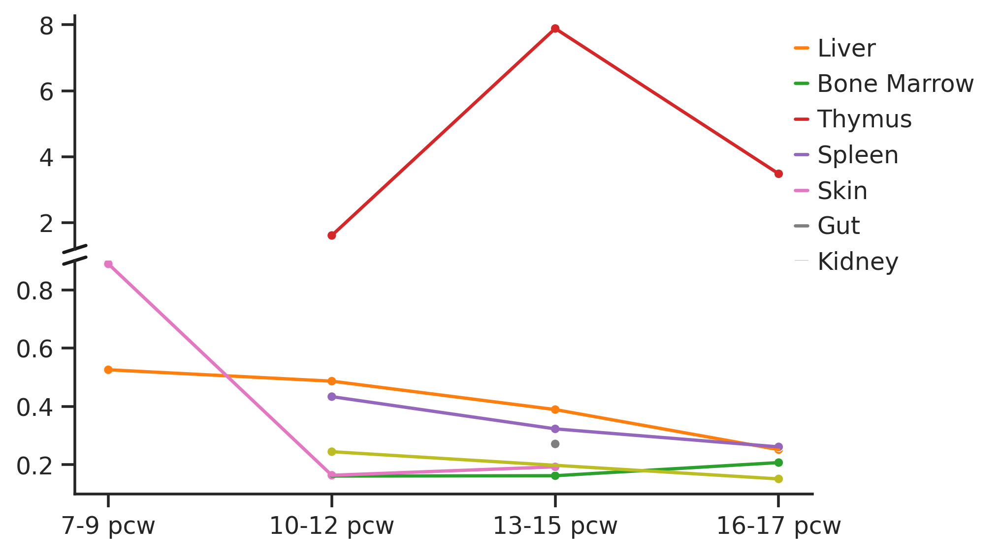

In [42]:
sb.set_theme(style='ticks')
f, (ax_top, ax_bottom) = plt.subplots(ncols=1, nrows=2, sharex=True, gridspec_kw={'hspace':0.05},figsize=(6,4))
g1 = sb.lineplot(data=cc3, x='age_bin', y='B1/B2 ratio', hue='organ',ax=ax_top,palette=organ_color_map)
s1 = sb.scatterplot(cc3.loc[:,'age_bin'], cc3.loc[:,'B1/B2 ratio'], hue=cc3.loc[:,'organ'],size=10,
                    ax=ax_top,palette=organ_color_map)
g2 = sb.lineplot(data=cc3, x='age_bin', y='B1/B2 ratio', hue='organ',ax=ax_bottom,palette=organ_color_map)
s2 = sb.scatterplot(cc3.loc[:,'age_bin'], cc3.loc[:,'B1/B2 ratio'], hue=cc3.loc[:,'organ'],size=10,
                    ax=ax_bottom,palette=organ_color_map)

ax_top.set_ylim(bottom=1.2)   # those limits are fake
ax_bottom.set_ylim(0.1,0.9)

sb.despine(ax=ax_bottom)
sb.despine(ax=ax_top, bottom=True)

ax = ax_top
d = .015  # how big to make the diagonal lines in axes coordinates
# arguments to pass to plot, just so we don't keep repeating them
kwargs = dict(transform=ax.transAxes, color='k', clip_on=False)
ax.plot((-d, +d), (-d, +d), **kwargs)        # top-left diagonal

ax2 = ax_bottom
kwargs.update(transform=ax2.transAxes)  # switch to the bottom axes
ax2.plot((-d, +d), (1 - d, 1 + d), **kwargs)  # bottom-left diagonal

#remove legend 
#ax_top.legend_.remove()
ax_bottom.legend_.remove()
ax_top.set_ylabel('')    
ax_top.set_xlabel('')
ax_bottom.set_ylabel('')    
ax_bottom.set_xlabel('')
ax_top.tick_params(bottom=False)
h,l = ax_top.get_legend_handles_labels()
l1 = ax_top.legend(h[:7], l[:7],loc='upper right',bbox_to_anchor=(1.25, 1),frameon=False)
plt.savefig(fig_path+'Fig4_B1_B2_ratio_across_age.pdf',bbox_inches='tight')

# Disentangle the identity of different B cell types in CYCLING_B fraction --> show fraction of cycling cells in B1 vs B2

### use celltypist (logistic regression) to predict which cycling_B cells are B1 vs B2

In [43]:
import celltypist
from celltypist import models

In [44]:
celltypist.__version__

'0.1.9'

In [53]:
B_new = B.copy()
tmp = B_new.X.copy()
tmp = np.expm1(tmp) # inverse log1p
B_new.X = tmp.copy()

In [54]:
sc.pp.normalize_per_cell(B_new,counts_per_cell_after=1e4,key_n_counts='total_counts')
sc.pp.log1p(B_new)

In [64]:
# remove cycling genes in logistic regression (in github folder metadata/cc_genes.csv)
cc_genes = pd.read_csv('/home/jovyan/Pan_fetal_immune/metadata/cc_genes.csv',index_col=0)
cc_genes = list(cc_genes['0'])

In [65]:
B_nocc = B_new[:,~(B_new.var_names.isin(cc_genes))].copy()
B_nocc.raw = B_nocc.copy()

In [66]:
adata_training = B_nocc[~(B_nocc.obs['anno_lvl_2_final_clean']=='CYCLING_B')].copy()
adata_test = B_new[B_new.obs['anno_lvl_2_final_clean']=='CYCLING_B'].copy() #not to remove cc genes in adata_test otherwise can't run prediction 

In [67]:
model = celltypist.train(adata_training, 'anno_lvl_2_final_clean', check_expression = False, n_jobs = 10, feature_selection = True)

🍳 Preparing data before training
✂️ 10125 non-expressed genes are filtered out
⚖️ Scaling input data
🏋️ Training data using SGD logistic regression
🔎 Selecting features
🧬 848 features are selected
🏋️ Starting the second round of training
🏋️ Training data using logistic regression
✅ Model training done!


In [68]:
model.write('panfetal_B_celltypist.pkl')

In [69]:
predictions = celltypist.annotate(adata_test, model = 'panfetal_B_celltypist.pkl', majority_voting = False)

🔬 Input data has 1909 cells and 33538 genes
🔗 Matching reference genes in the model
🧬 848 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


In [70]:
adata_test = predictions.to_adata()

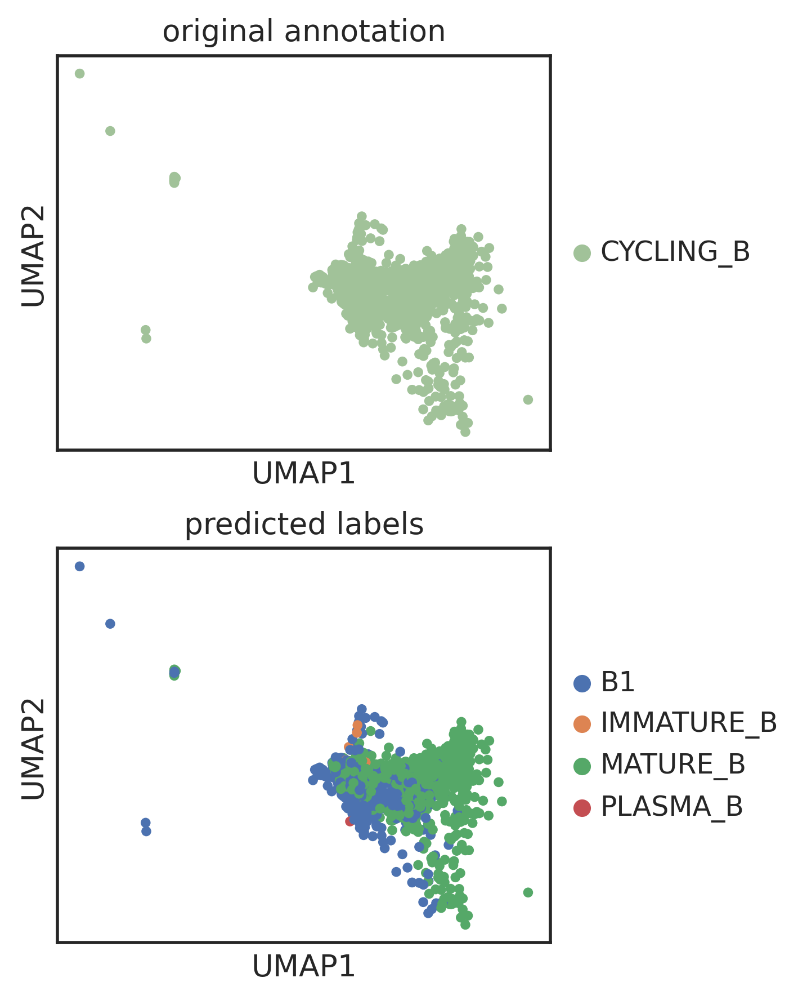

In [87]:
plt.rcParams["figure.figsize"] = [3,3]
sc.pl.umap(adata_test, color=['anno_lvl_2_final_clean','predicted_labels'], title=['original annotation','predicted labels'],ncols=1,save='cyclingb_lr.pdf')

In [72]:
B.obs['B_prediction'] = B.obs['anno_lvl_2_final_clean'].astype('str')
B.obs.loc[B.obs_names.isin(adata_test.obs_names),'B_prediction'] = lookup(B.obs_names[B.obs_names.isin(adata_test.obs_names)],
                                                                                         adata_test.obs,-1,'predicted_labels')
B.obs['B_prediction'] = B.obs['B_prediction'].astype('category')

In [73]:
B.obs['anno_lvl_2_final_clean'] = B.obs['anno_lvl_2_final_clean'].cat.reorder_categories(['IMMATURE_B','MATURE_B','B1',  'PLASMA_B','CYCLING_B'])
B.obs['B_prediction'] = B.obs['B_prediction'].cat.reorder_categories(['IMMATURE_B','MATURE_B', 'B1', 'PLASMA_B'])

In [74]:
B.write_h5ad('write/B_lr.h5ad')

In [75]:
B=sc.read('write/B_lr.h5ad')

In [76]:
B_plot.obs['B_prediction']=lookup(B_plot.obs_names, B.obs, -1,'B_prediction')
B_plot.obs['B_prediction'] =B_plot.obs['B_prediction'].astype('category')
B_plot.obs['B_prediction'] = B_plot.obs['B_prediction'].cat.reorder_categories(['IMMATURE_B','MATURE_B', 'B1', 'PLASMA_B'])

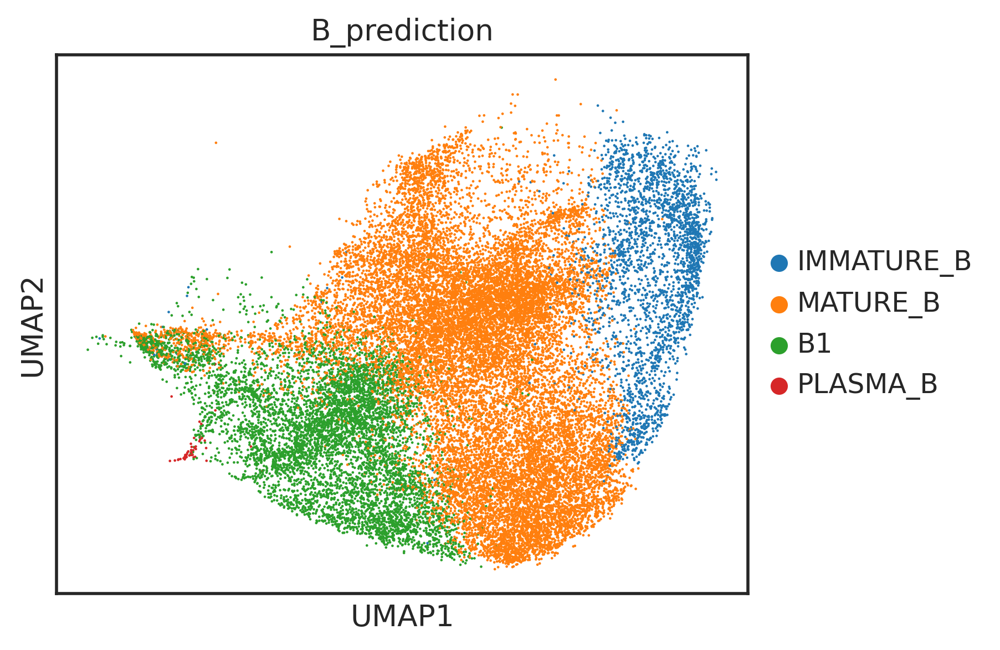

In [78]:
plt.rcParams["figure.figsize"] = [5,4]
sc.pl.umap(B_plot,color=['B_prediction'],ncols=1,palette = vega_20_scanpy)

### group by organ

In [79]:
proliferating = list(np.array(B[:,'MKI67'].X.todense()).flatten()>0)
B.obs['cycling']=0
B.obs.loc[proliferating, 'cycling']='cycling'
df_total = B.obs
df_total.to_csv('csv/B1_cycling_lr.csv')

In [80]:
df = pd.DataFrame(columns = ['ct','organ','cycling%','total'],index = range(36))

In [81]:
ctl = list(set(B.obs['B_prediction']))
organl = list(set(B.obs['organ']))
df.loc[:,['ct','organ']] = np.array([(x, y) for x in ctl for y in organl])

In [82]:
for i in df.index: 
    ct = df['ct'][i]
    organ = df['organ'][i]
    a = np.array(B.obs['B_prediction']==ct)
    b = np.array(B.obs['organ']==organ)
    c = np.array(B.obs['cycling']=='cycling')
    
    df['total'][i] = sum(a&b)
    df['cycling%'][i] = sum(a&b&c)/sum(a&b) *100

In [83]:
df1 = df.loc[df['total']>=10,:]

In [84]:
df1['ct'] = df1['ct'].astype('category')
df1['ct'] = df1['ct'].cat.reorder_categories(['IMMATURE_B','MATURE_B','B1','PLASMA_B'])
ct_num = dict({'IMMATURE_B':0,'MATURE_B':1,'B1':2,'PLASMA_B':3})
df1['ct_num'] = [ct_num[a] for a in df1['ct']]
random.seed(1712)
df1['ct_num'] = df1['ct_num'].astype('float') + np.random.uniform(low=-0.1,high=0.1,size=df1.shape[0])*1.5 #change ct to float with gitter
df1['log10(cell count)']=np.log10(df1['total'].astype('float'))

<ipython-input-84-208b76586873>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['ct'] = df1['ct'].astype('category')
<ipython-input-84-208b76586873>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['ct'] = df1['ct'].cat.reorder_categories(['IMMATURE_B','MATURE_B','B1','PLASMA_B'])
<ipython-input-84-208b76586873>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation:

In [85]:
organ_color_map = dict(zip(organ_order, np.array(sb.color_palette('tab10'))[range(len(organ_order))]))

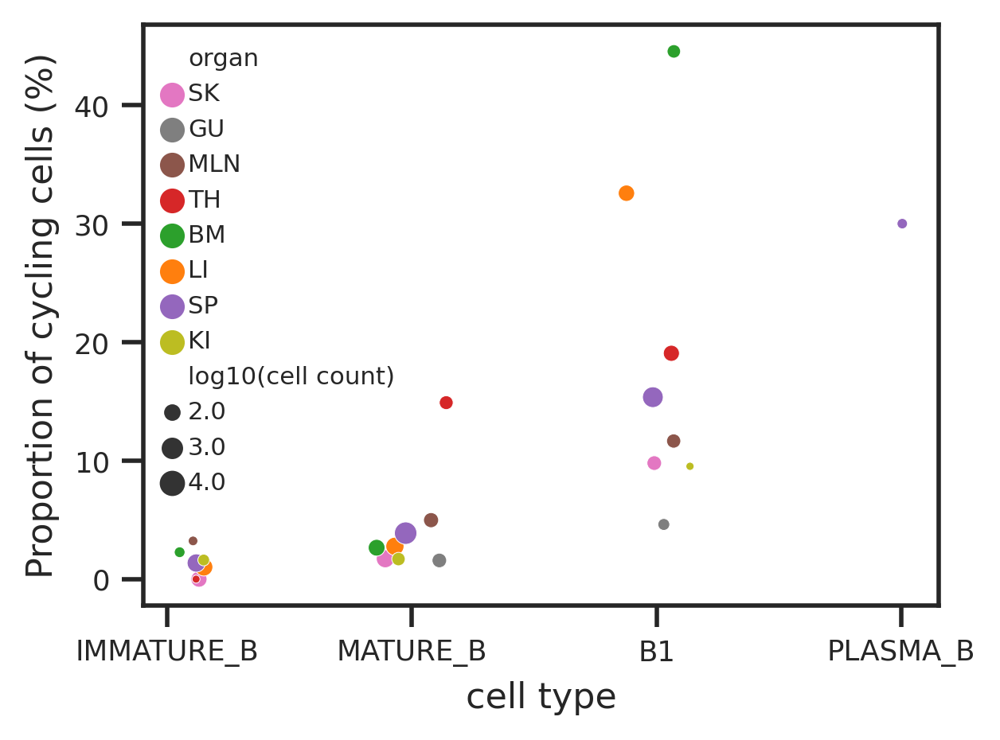

In [88]:
sb.set_theme(style='ticks')
fig, ax = plt.subplots(figsize=(4,3))
s = sb.scatterplot(x = 'ct_num', y ='cycling%', data=df1, hue='organ',size='log10(cell count)',sizes = (5,40),palette=organ_color_map)
s.set_ylabel('Proportion of cycling cells (%)', fontsize=10)
s.set_xlabel('cell type', fontsize=10)
ax.set_xticklabels([0,'IMMATURE_B','MATURE_B','B1','PLASMA_B'])
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
ax.xaxis.grid(False)
h,l = ax.get_legend_handles_labels()
l1 = ax.legend(h[:10]+[h[-5]]+[h[-3]]+[h[-1]],l[:10]+[l[-5]]+[l[-3]]+[l[-1]], loc='upper left',frameon=False, fontsize='xx-small')
plt.savefig(fig_path+'B1_cycling.pdf',bbox_inches='tight')

In [90]:
%%R
### use LR to compare the cycling %
df = read.csv('csv/B1_cycling_lr.csv')
df = df[,c('age','organ','donor','cycling','B_prediction')]
df$cycling <- df$cycling == 'cycling'
summary(glm(cycling ~ donor+organ+B_prediction, data=df))


Call:
glm(formula = cycling ~ donor + organ + B_prediction, data = df)

Deviance Residuals: 
     Min        1Q    Median        3Q       Max  
-0.38142  -0.06685  -0.03655  -0.02223   1.01389  

Coefficients: (1 not defined because of singularities)
                        Estimate Std. Error t value Pr(>|t|)    
(Intercept)             0.197660   0.091532   2.159  0.03082 *  
donorF21                0.021717   0.091154   0.238  0.81169    
donorF22                0.059022   0.105127   0.561  0.57451    
donorF23                0.008099   0.092288   0.088  0.93007    
donorF29                0.001048   0.091082   0.012  0.99082    
donorF30                0.045663   0.091137   0.501  0.61635    
donorF32               -0.038994   0.118632  -0.329  0.74239    
donorF33                0.003307   0.093076   0.036  0.97166    
donorF34               -0.016452   0.104524  -0.157  0.87493    
donorF35                0.072015   0.108966   0.661  0.50868    
donorF38                0.054925 

# B cell activation score

In [91]:
b1b2 = adata[adata.obs['anno_lvl_2_final_clean'].isin(['B1','MATURE_B'])]

In [94]:
gene_list = pd.read_csv('/home/jovyan/gene_list/gobp_b_cell_activation.txt', delimiter='\t', header=None)

In [95]:
gene_list = list(gene_list[0])

In [97]:
len(gene_list)

329

In [98]:
sc.tl.score_genes(b1b2, gene_list, score_name='B_cell_activation_score')

Trying to set attribute `.obs` of view, copying.


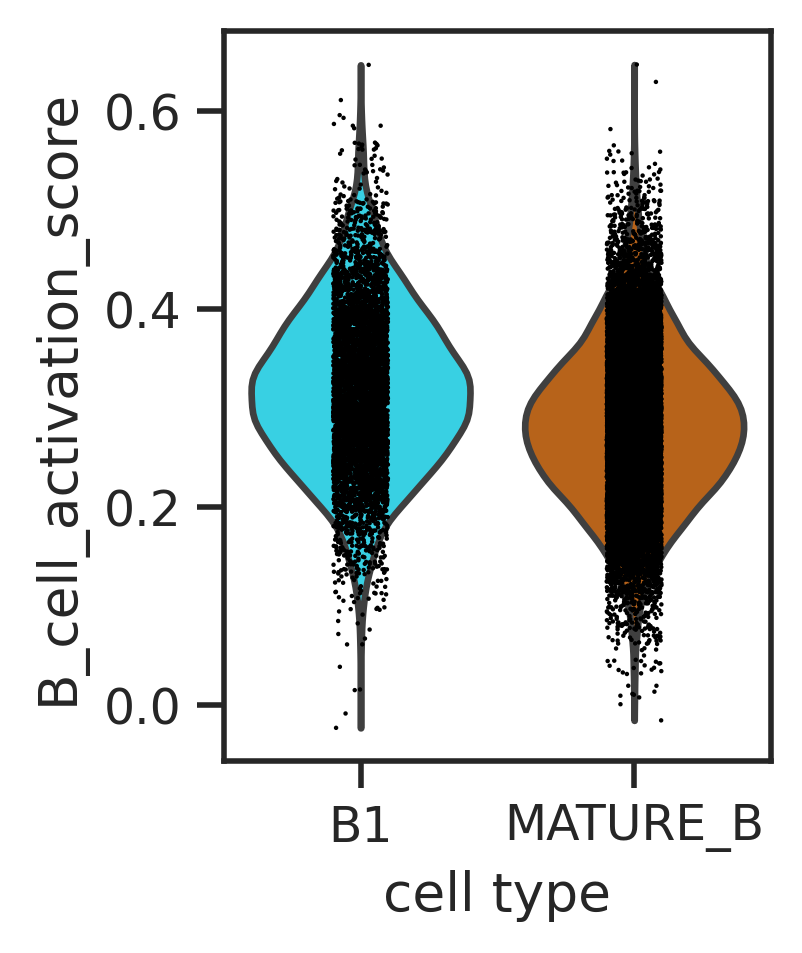

In [99]:
sc.pl.violin(b1b2, keys="B_cell_activation_score", groupby="anno_lvl_2_final_clean", xlabel='cell type',save='b1_gene_list_score.pdf')

In [101]:
data = b1b2.obs

In [104]:
%%R -i data
fit = glm(B_cell_activation_score ~ donor + organ + anno_lvl_2_final_clean, data=data)
summary(fit)


Call:
glm(formula = B_cell_activation_score ~ donor + organ + anno_lvl_2_final_clean, 
    data = data)

Deviance Residuals: 
     Min        1Q    Median        3Q       Max  
-0.33490  -0.04766  -0.00032   0.04640   0.30862  

Coefficients: (1 not defined because of singularities)
                                Estimate Std. Error t value Pr(>|t|)    
(Intercept)                     0.321295   0.041298   7.780 7.56e-15 ***
donorF21                       -0.035361   0.041219  -0.858 0.390966    
donorF22                       -0.035439   0.050442  -0.703 0.482328    
donorF23                       -0.060029   0.041613  -1.443 0.149163    
donorF29                        0.037785   0.041201   0.917 0.359108    
donorF30                       -0.039722   0.041214  -0.964 0.335163    
donorF32                        0.028422   0.048311   0.588 0.556334    
donorF33                       -0.056921   0.041744  -1.364 0.172719    
donorF34                       -0.038052   0.045402  -0.83

### expression of CCR10 ligand

In [31]:
stroma = sc.read('/nfs/team205/ed6/data/Fetal_immune/PAN.A01.v01.entire_data_normalised_log.20210429.STROMA.embedding.h5ad')

Only considering the two last: ['.embedding', '.h5ad'].
Only considering the two last: ['.embedding', '.h5ad'].


In [36]:
stroma = stroma[~stroma.obs_names.isin(maternal_barcodes['barcodes'])]

In [37]:
for col in obs:
    stroma.obs[col] = obs[col] # use anno_lvl_2_final_clean

Trying to set attribute `.obs` of view, copying.


In [38]:
df = pd.DataFrame(index = set(stroma.obs['anno_lvl_2_final_clean']), columns = ['CCL27','CCL28'])
for gene in df.columns:
    data_sl = stroma[:,gene].X.todense()
    anno = stroma.obs['anno_lvl_2_final_clean']
    for ct in df.index:
        df.loc[ct, gene]=np.mean(data_sl[anno==ct,])
df = df.fillna(0)    

In [39]:
df

,CCL27,CCL28
FIBROBLAST_I,0.014995,0.008774
FIBROBLAST_X,0.006182,0.000305
MYOFIBROBLAST,0.016141,0.005364
FIBROBLAST_IV,0.029430,0.002506
OSTEOBLAST,0.007102,0.498425
MESOTHELIUM,0.009705,0.037991
FIBROBLAST_XII,0.000941,0.002241
ENDOTHELIUM_V,0.000000,0.000000
FIBROBLAST_XIV,0.002460,0.000929
FIBROBLAST_IX,0.007611,0.001653


In [93]:
df1 = df.loc[np.array(df['CCL27']> 0.05) |  np.array(df['CCL28']> 0.05)]

In [94]:
stroma_select = stroma[stroma.obs['anno_lvl_2_final_clean'].isin(df1.index)]

Trying to set attribute `.obs` of view, copying.
... storing 'file' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'predicted_doublets' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'name' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'uniform_label' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'uniform_label_expanded_merged' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'uniform_label_lvl0' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'organ' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'Sample.lanes' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'Sort_id' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'method' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'donor' as categorical
Trying to 

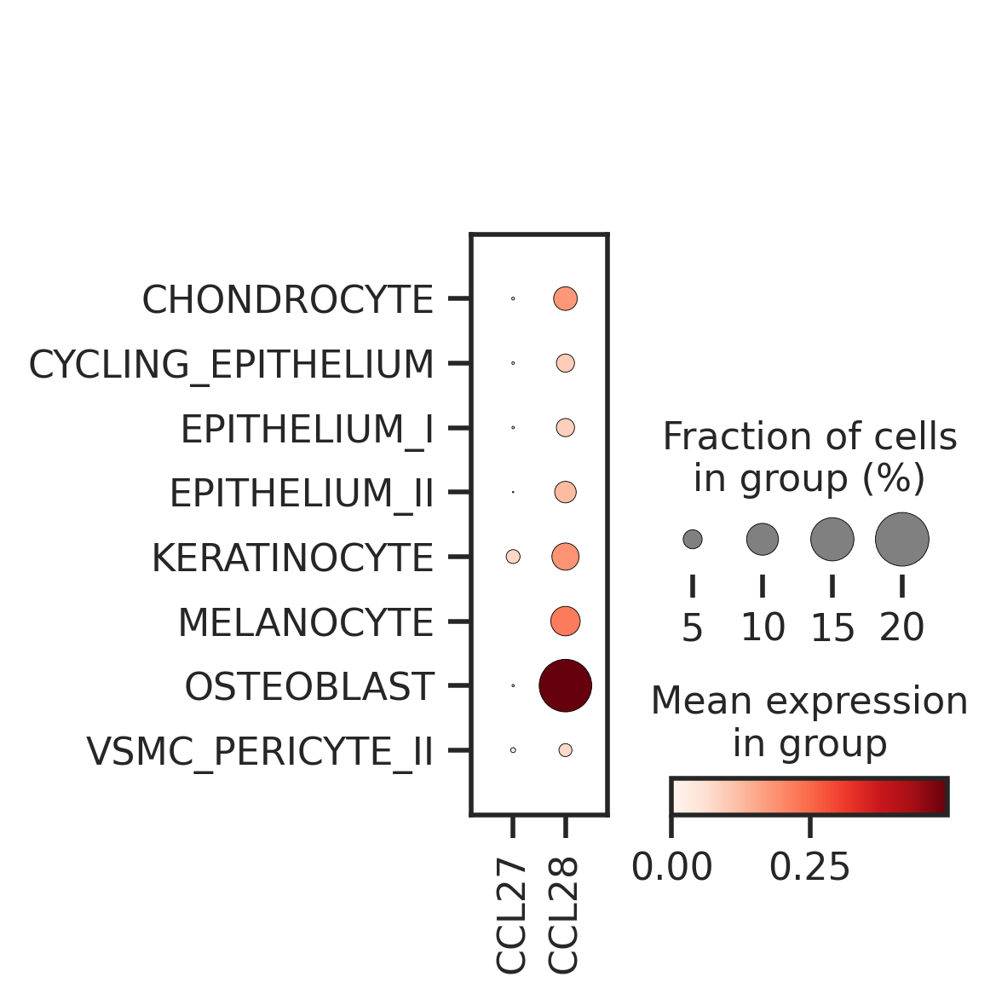

In [95]:
sc.pl.dotplot(stroma_select, var_names = ['CCL27','CCL28'],groupby='anno_lvl_2_final_clean',save='Fig4_B1_CCR10_ligand.pdf')

# BCR comparison for B1 vs mature B

In [ ]:
# load productive BCR
BCR = pd.read_csv('/lustre/scratch117/cellgen/team297/kt16/panfetal/PAN.A01.v01.entire_data_normalised_log.20210429.LYMPHOID.embedding_dandelion_productive_031922.csv',
                 index_col=0)
BCR = BCR.loc[:,BCR.columns[26:]]

In [ ]:
for col in BCR:
    adata.obs[col]=BCR[col]

In [ ]:
# load metadata
meta = pd.read_csv('/home/jovyan/Pan_fetal_immune/metadata/BCR_metadata_29032022.csv')

In [ ]:
adata_bcr = adata[adata.obs['file'].isin(meta['GEX file'])].copy()

### Plot expression pattern of Heavy and Light chains

In [123]:
adata_bcr.obs['anno_lvl_2_final_clean'] = adata_bcr.obs['anno_lvl_2_final_clean'].astype('category')
adata_bcr.obs['anno_lvl_2_final_clean'] = adata_bcr.obs['anno_lvl_2_final_clean'].cat.reorder_categories(['DN(early)_T','DN(P)_T','DN(Q)_T','DP(P)_T','DP(Q)_T','ABT(ENTRY)','CD8+T',
                                                                                                          'CD4+T','TREG','CYCLING_T','CD8AA','TYPE_3_INNATE_T','ILC3','ILC2','CYCLING_ILC',
                                                                                                          'TYPE_1_INNATE_T','NK','CYCLING_NK','HSC_MPP', 'CYCLING_MPP', 'LMPP_MLP',
                                                                                                          'MEMP','CYCLING_MEMP', 'MEP', 'EARLY_MK', 'CMP', 'GMP', 
                                                                                                          'PROMONOCYTE', 'PROMYELOCYTE','PRE_PRO_B','PRO_B','LATE_PRO_B',
                                                                                                          'LARGE_PRE_B','SMALL_PRE_B','IMMATURE_B','MATURE_B','CYCLING_B','B1','PLASMA_B',
                                                                                                          'LOW_Q_INCONSISTENT','DOUBLET', 'DOUBLET_ERY_B','HIGH_MITO'])

In [124]:
adata_bcr.obs['locus_status_summary'] = adata_bcr.obs['locus_status_summary'].astype('category')
adata_bcr.obs['locus_status_summary'] = adata_bcr.obs['locus_status_summary'].cat.reorder_categories(['IGH + IGK', 'IGH + IGL', 'IGH_only', 'No_contig'])

In [132]:
df = pd.DataFrame(index = adata_bcr.obs['anno_lvl_2_final_clean'].cat.categories, columns=adata_bcr.obs['locus_status_summary'].cat.categories)
for ct in df.index:
    ct_filter = adata_bcr.obs['anno_lvl_2_final_clean']==ct
    counter = Counter(adata_bcr.obs.loc[ct_filter,'locus_status_summary'])
    for status in df.columns:
        df.loc[ct,status] = counter[status]

In [133]:
df = df.loc[np.sum(df,axis=1)>=10,:]
df1 = df / np.array(np.sum(df,axis=1)).reshape(df.shape[0],1) * 100
df1['celltype']=df1.index

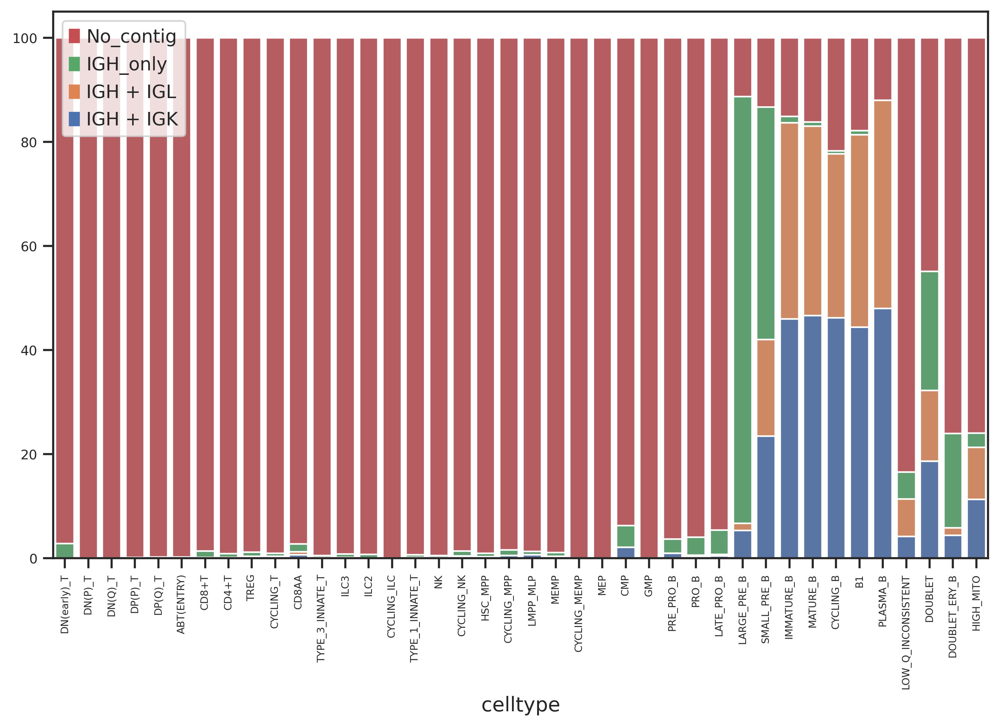

In [134]:
import matplotlib.patches as mpatches
plt.figure(figsize=(10, 6))

legend = []

for i in range(4)[::-1]:
    bar = sb.barplot(x='celltype',  y=np.sum(df1.iloc[:,0:i+1],axis=1), data=df1, color=sb.color_palette()[i])
    legend = legend+[mpatches.Patch(color=sb.color_palette()[i], label=df1.columns[i])]
plt.xticks(fontsize=6,rotation=90)
plt.yticks(fontsize=8)

# add legend
plt.legend(handles=legend)

In [136]:
B_all = adata_bcr[adata_bcr.obs['anno_lvl_2_final_clean'].isin(['PRE_PRO_B','PRO_B','LATE_PRO_B','LARGE_PRE_B','SMALL_PRE_B','IMMATURE_B',
                                            'MATURE_B','CYCLING_B','B1','PLASMA_B'])].copy()
B_all_plot = B_all[B_all.obsm['X_umap'][:,0]>7]

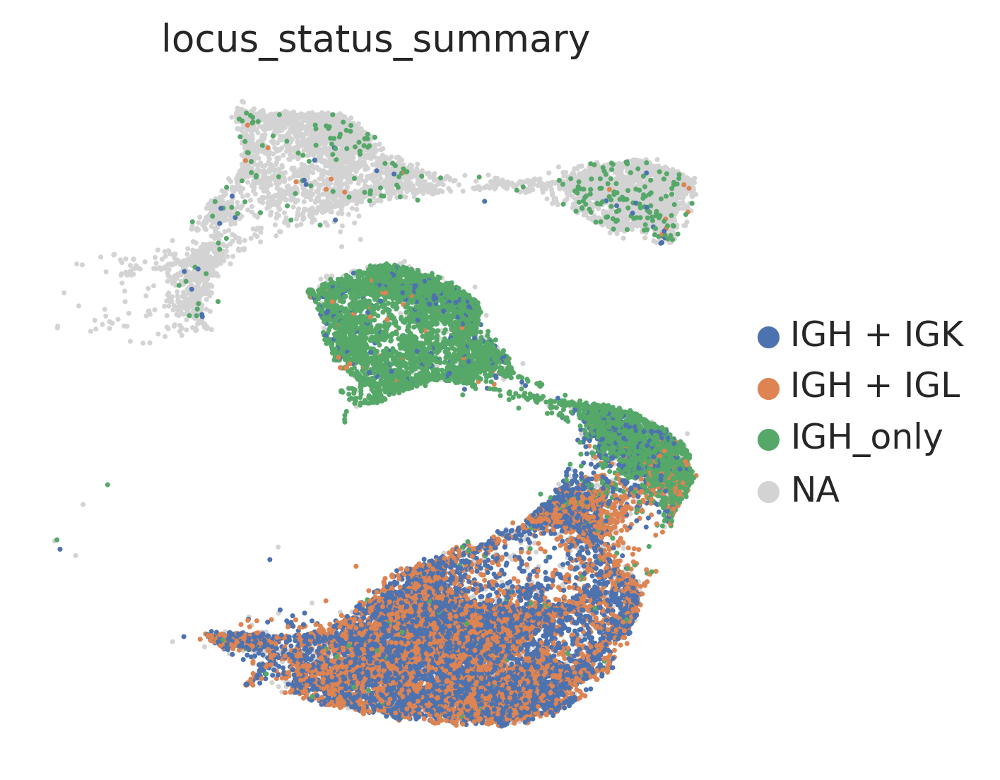

In [139]:
plt.rcParams["figure.figsize"] = [4,4]
sc.pl.umap(B_all_plot,color=['locus_status_summary'],groups=['IGH + IGK', 'IGH + IGL', 'IGH_only'],frameon=False,size=10,save='Heavy_light_chain.pdf')

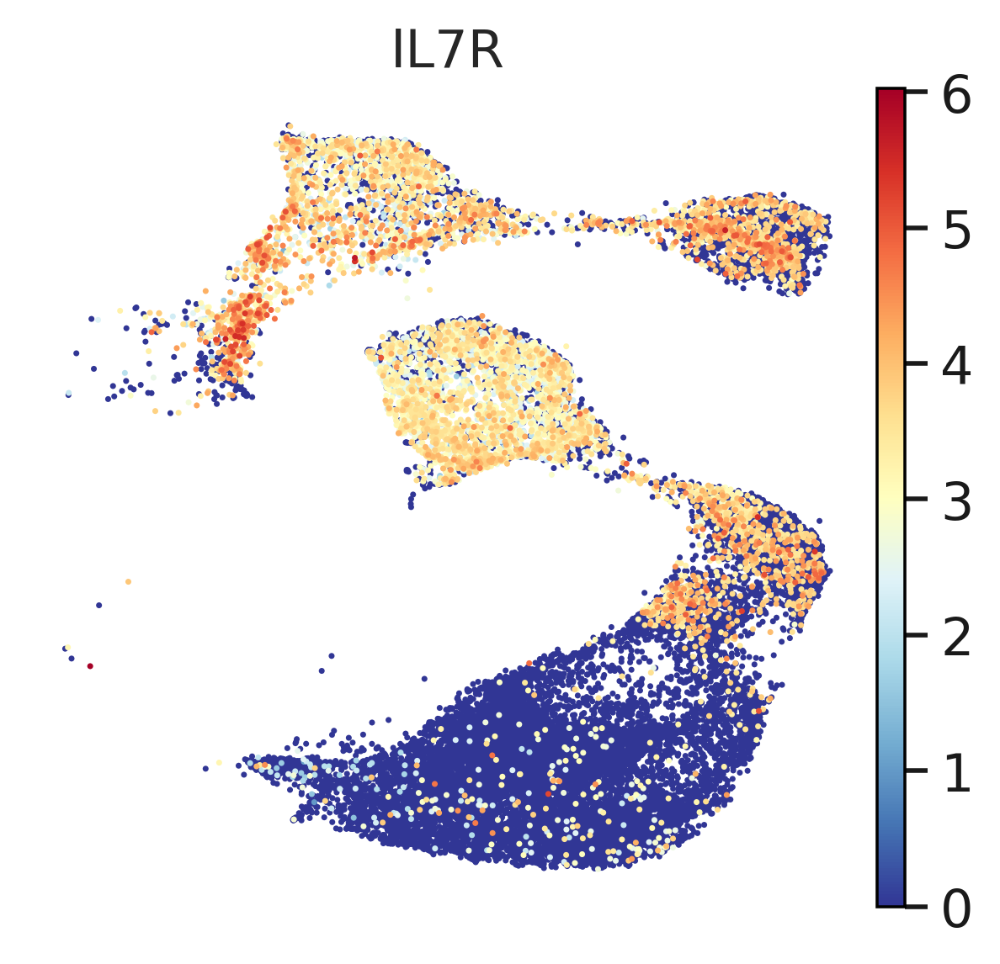

In [143]:
plt.rcParams["figure.figsize"] = [4.4,4]
sc.pl.umap(B_all_plot,color=['IL7R'],frameon=False,size=10,save='IL7R.pdf')

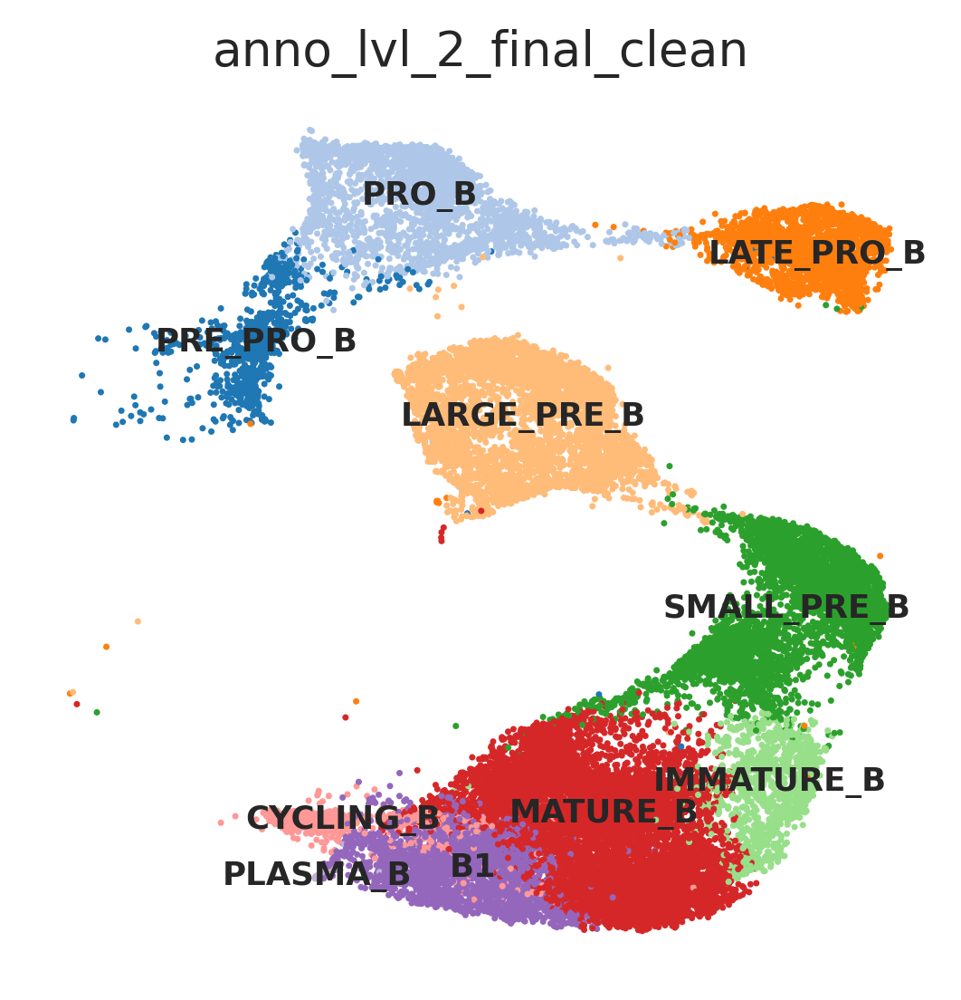

In [141]:
plt.rcParams["figure.figsize"] = [4,4]
sc.pl.umap(B_all_plot,color=['anno_lvl_2_final_clean'],frameon=False,legend_loc='on data',legend_fontsize=8,size=10,palette=sc.pl.palettes.vega_20,save='lymphoid_anno.pdf')

### further filtering adata_bcr and write the data

In [144]:
adata_bcr = adata_bcr[adata_bcr.obs['contig_QC_pass'] == 'True']

In [145]:
adata_bcr.write_h5ad('write/lymphoid_bcr_combine_productive.h5ad')

Trying to set attribute `.obs` of view, copying.
... storing 'has_contig' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'contig_QC_pass' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'clone_id' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'clone_id_by_size' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'sample_id' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'locus_VDJ' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'locus_VJ' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'productive_VDJ' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'productive_VJ' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'v_call_genotyped_VDJ' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'v_call_genotyped_VJ' as cat

In [8]:
adata_bcr = sc.read('write/lymphoid_bcr_combine_productive.h5ad')

adata_bcr is the lymphoid with productive bcr, filtered by contig QC

# IGD/IGM expression in mature B cells

... storing 'has_contig' as categorical
... storing 'contig_QC_pass' as categorical
... storing 'clone_id' as categorical
... storing 'clone_id_by_size' as categorical
... storing 'sample_id' as categorical
... storing 'locus_VDJ' as categorical
... storing 'locus_VJ' as categorical
... storing 'productive_VDJ' as categorical
... storing 'productive_VJ' as categorical
... storing 'v_call_genotyped_VDJ' as categorical
... storing 'v_call_genotyped_VJ' as categorical
... storing 'd_call_VDJ' as categorical
... storing 'j_call_VDJ' as categorical
... storing 'j_call_VJ' as categorical
... storing 'c_call_VDJ' as categorical
... storing 'c_call_VJ' as categorical
... storing 'duplicate_count_VDJ' as categorical
... storing 'duplicate_count_VJ' as categorical
... storing 'junction_aa_VDJ' as categorical
... storing 'junction_aa_VJ' as categorical
... storing 'locus_status' as categorical
... storing 'locus_status_summary' as categorical
... storing 'productive' as categorical
... storing 'p

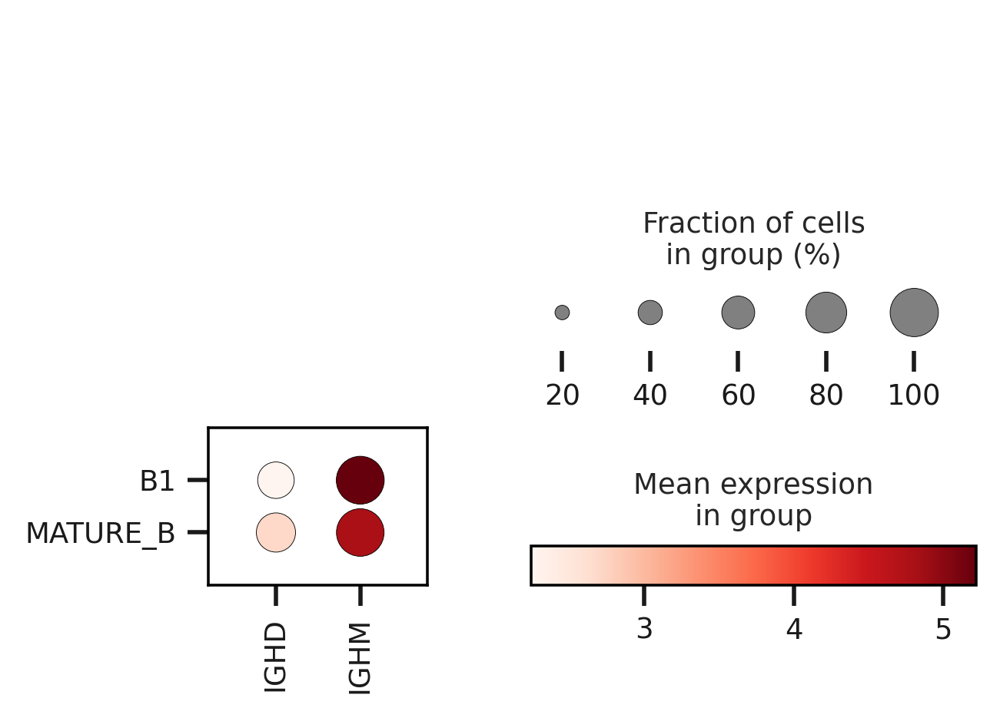

In [148]:
tmp = adata[adata.obs['anno_lvl_2_final_clean'].isin(['MATURE_B','B1'])].copy()
tmp.obs['anno_lvl_2_final_clean'] = tmp.obs['anno_lvl_2_final_clean'].cat.reorder_categories(['B1','MATURE_B'])

fig, ax = plt.subplots(figsize=(4,3))
plt.rcParams.update({'font.size': 10})   
sc.pl.dotplot(tmp, var_names=['IGHD','IGHM'],swap_axes=False,groupby=['anno_lvl_2_final_clean'], ax=ax,save='IGHD_IGHM.pdf')

# N-addition & mutation frequency B1 vs B2

B_bcr is the mature B cells with productive bcr, filtered by contig QC

In [9]:
B_bcr = adata_bcr[adata_bcr.obs['anno_lvl_2_final_clean'].isin(['IMMATURE_B','MATURE_B','CYCLING_B','B1','PLASMA_B'])].copy()

In [10]:
bdata = B_bcr[B_bcr.obs['locus_status_summary'].isin(['IGH + IGK', 'IGH + IGL'])].copy() #choose cells that have both vdj and vj (11522 cells -> 11406)

In [11]:
bdata.obs.loc[:,['mu_count','mu_count_VDJ','mu_count_VJ','mu_freq_VDJ','mu_freq_VJ', # mu_count = (mu_count_VDJ +mu_count_VJ)/2
                 'np1_length_VDJ','np2_length_VDJ','np1_length_VJ','junction_length_VDJ','junction_length_VJ']]

,mu_count,mu_count_VDJ,mu_count_VJ,mu_freq_VDJ,mu_freq_VJ,np1_length_VDJ,np2_length_VDJ,np1_length_VJ,junction_length_VDJ,junction_length_VJ
index,,,,,,,,,,
Human_colon_16S8159187-AGCTCTCAGTGTACTC,0.0,0.0,0.0,0.0,0.0,16.0,NaN,0.0,45.0,33.0
Human_colon_16S8159187-TTAGGCATCAAGAAGT,0.0,0.0,0.0,0.0,0.0,3.0,NaN,1.0,21.0,39.0
Human_colon_16S8159187-AGAATAGAGTGTGAAT,0.0,0.0,0.0,0.0,0.0,6.0,8.0,0.0,51.0,36.0
Human_colon_16S8159187-CTGCTGTTCCACGTTC,0.0,0.0,0.0,0.0,0.0,14.0,NaN,0.0,36.0,33.0
Human_colon_16S8159187-GCGCCAAGTAGATTAG,0.0,0.0,0.0,0.0,0.0,4.0,5.0,0.0,42.0,39.0
...,...,...,...,...,...,...,...,...,...,...
FCAImmP7803020-ACGATACCAAGCCGTC,0.0,0.0,0.0,0.0,0.0,15.0,NaN,0.0,45.0,30.0
FCAImmP7803020-AGGGATGGTCGCGAAA,0.0,0.0,0.0,0.0,0.0,8.0,NaN,0.0,24.0,39.0
FCAImmP7803020-GGATTACCAGATCCAT,0.0,0.0,0.0,0.0,0.0,15.0,NaN,0.0,42.0,36.0


## Compare N-addition length

In [12]:
## 6699 cells don't have d gene called, so na for np2_length_vdj 
tb = bdata.obs.loc[bdata.obs['anno_lvl_2_final_clean'].isin(['B1','MATURE_B']), ['donor','organ','d_call_VDJ',
                                                                                 'anno_lvl_2_final_clean','np1_length_VDJ','np2_length_VDJ','np1_length_VJ','junction_length_VDJ','junction_length_VJ','mu_freq_VDJ','mu_freq_VJ']]

In [13]:
tb["anno_lvl_2_final_clean"] = tb["anno_lvl_2_final_clean"].astype('str').astype('category')
tb["anno_lvl_2_final_clean"].cat.categories = ['B1','MATURE_B']

In [14]:
tb = tb.rename(columns={'np1_length_VDJ': 'NP_addition_length_VD',
                        'np2_length_VDJ': 'NP_addition_length_DJ',
                        'np1_length_VJ': 'NP_addition_length_VJ',
                        'junction_length_VDJ': 'CDR3_junction_length_VDJ',
                        'junction_length_VJ':'CDR3_junction_length_VJ',
                        'mu_freq_VDJ': 'mutation_frequency_VDJ',
                        'mu_freq_VJ': 'mutation_frequency_VJ'
                       })

In [15]:
# change mutation frequency to percentage
tb.loc[:,'mutation_frequency_VDJ'] = tb.loc[:,'mutation_frequency_VDJ']*100
tb.loc[:,'mutation_frequency_VJ'] = tb.loc[:,'mutation_frequency_VJ']*100

In [16]:
# filter out cells without d calling in VDJ
tb_filter = tb.loc[~(tb['d_call_VDJ']=='nan'),:]

In [17]:
# create tb_sub with VD, DJ np addition length from tb_filter
tb_sub = pd.DataFrame({'celltype':list(tb_filter.loc[:,'anno_lvl_2_final_clean']) *2,
                       'nucleotide length':list(tb_filter.loc[:,'NP_addition_length_VD']) + list(tb_filter.loc[:,'NP_addition_length_DJ']),
                       'junction': ['VD']*tb_filter.shape[0] + ['DJ']*tb_filter.shape[0]
})
tb_sub['celltype']=tb_sub['celltype'].astype('category')

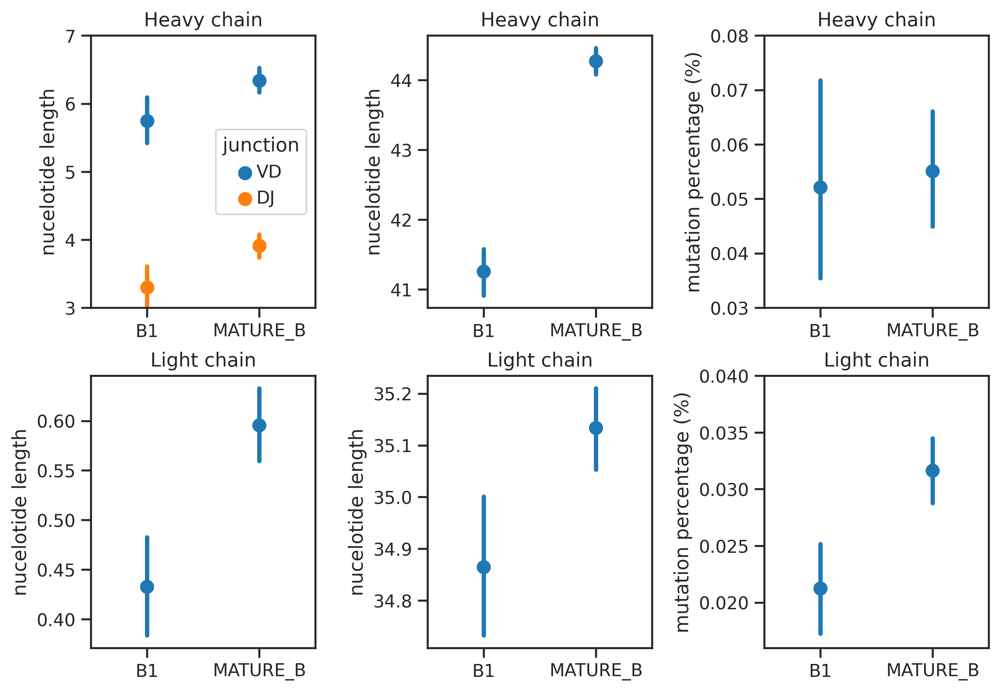

In [18]:
sb.set_theme(style="ticks")
fig, ax = plt.subplots(2,3,figsize=(10,7))
plt.subplots_adjust(wspace=0.5,hspace=0.25)

sb.pointplot(data=tb_sub, y='nucleotide length', x="celltype",hue='junction',ax=ax[0,0],palette='tab10',join=False)
ax[0,0].set_title('Heavy chain')
ax[0,0].set_ylabel('nucelotide length') 
ax[0,0].set_xlabel('') 
ax[0,0].set_ylim(3,7)

sb.pointplot(data=tb, y=tb.columns[6], x="anno_lvl_2_final_clean",ax=ax[1,0],ylabels=False,color=sb.color_palette('tab10')[0],join=False)
ax[1,0].set_title('Light chain')
ax[1,0].set_ylabel('nucelotide length') 
ax[1,0].set_xlabel('') 

sb.pointplot(data=tb, y=tb.columns[7], x="anno_lvl_2_final_clean",ax=ax[0,1],ylabels=False,color=sb.color_palette('tab10')[0],join=False)
ax[0,1].set_title('Heavy chain')
ax[0,1].set_ylabel('nucelotide length') 
ax[0,1].set_xlabel('')

sb.pointplot(data=tb, y=tb.columns[8], x="anno_lvl_2_final_clean",ax=ax[1,1],ylabels=False,color=sb.color_palette('tab10')[0],join=False)
ax[1,1].set_title('Light chain')
ax[1,1].set_ylabel('nucelotide length') 
ax[1,1].set_xlabel('')

sb.pointplot(data=tb, y=tb.columns[9], x="anno_lvl_2_final_clean",ax=ax[0,2],ylabels=False,color=sb.color_palette('tab10')[0],join=False)
ax[0,2].set_title('Heavy chain')
ax[0,2].set_ylabel('mutation percentage (%)') 
ax[0,2].set_xlabel('')
ax[0,2].set_ylim(0.03, 0.08)

sb.pointplot(data=tb, y=tb.columns[10], x="anno_lvl_2_final_clean",ax=ax[1,2],ylabels=False,color=sb.color_palette('tab10')[0],join=False)
ax[1,2].set_title('Light chain')
ax[1,2].set_ylabel('mutation percentage (%)') 
ax[1,2].set_xlabel('')
ax[1,2].set_ylim(0.016, 0.04)

plt.savefig(fig_path+'N_addition_raw_1.pdf',bbox_inches='tight')

### linear regression

use tb_filter to test for NP_addition_length_VD and NP_addition_length_DJ

In [19]:
%%R -i tb_filter
test_names = c('NP_addition_length_VD', 'NP_addition_length_DJ')
pval = rep(0,2)
names(pval) = test_names
for (name in test_names){
    fit = glm(tb_filter[,name] ~ donor + organ + anno_lvl_2_final_clean, data=tb_filter)
    pval[name]= summary(fit)$coefficients['anno_lvl_2_final_cleanMATURE_B','Pr(>|t|)']
}
pval

NP_addition_length_VD NP_addition_length_DJ 
          0.004240310           0.003197527 


use tb to test for 'NP-addition_length_VJ', 'CDR3_junction_length_VDJ','CDR3_junction_length_VJ','mutation_frequency_VDJ','mutation_frequency_VJ'

In [20]:
%%R -i tb
test_names = c('NP_addition_length_VJ', 'CDR3_junction_length_VDJ',
       'CDR3_junction_length_VJ', 'mutation_frequency_VDJ',
       'mutation_frequency_VJ')
pval = rep(0,5)
names(pval) = test_names
for (name in test_names){
    fit = glm(tb[,name] ~ donor + organ + anno_lvl_2_final_clean, data=tb)
    pval[name]= summary(fit)$coefficients['anno_lvl_2_final_cleanMATURE_B','Pr(>|t|)']
}
pval

   NP_addition_length_VJ CDR3_junction_length_VDJ  CDR3_junction_length_VJ 
            2.179074e-06             2.208743e-44             4.642639e-03 
  mutation_frequency_VDJ    mutation_frequency_VJ 
            6.359071e-01             2.432141e-03 


## VDJ usage difference

In [795]:
### cdata - cells with any bcr data i.e. no need to have full pair of bcr

In [10]:
cdata = adata_bcr[adata_bcr.obs['anno_lvl_2_final_clean'].isin(['PRO_B','LATE_PRO_B','LARGE_PRE_B','SMALL_PRE_B','IMMATURE_B','MATURE_B','B1',
                                                               'CYCLING_B'])].copy()

In [11]:
cdata.obs['anno_lvl_2_final_clean'] = cdata.obs['anno_lvl_2_final_clean'].cat.reorder_categories(['PRO_B','LATE_PRO_B','LARGE_PRE_B','SMALL_PRE_B','IMMATURE_B','MATURE_B','B1',
                                                               'CYCLING_B'])

housekeeping - for cells with IgM/IgD, they might have two chains called for each, choose the first one

In [15]:
tmp = cdata.obs.loc[cdata.obs['isotype_summary']=='IgM|IgD',['v_call_genotyped_VJ','j_call_VJ','v_call_genotyped_VDJ','d_call_VDJ','j_call_VDJ']]

In [19]:
tmp.shape

(99, 5)

In [18]:
cdata.obs['v_call_genotyped_VJ'] = cdata.obs['v_call_genotyped_VJ'].astype('str')
cdata.obs['j_call_VJ'] = cdata.obs['j_call_VJ'].astype('str')
cdata.obs['v_call_genotyped_VDJ'] = cdata.obs['v_call_genotyped_VDJ'].astype('str')
cdata.obs['d_call_VDJ'] = cdata.obs['d_call_VDJ'].astype('str')
cdata.obs['j_call_VDJ'] = cdata.obs['j_call_VDJ'].astype('str')

In [20]:
cdata.obs.loc[cdata.obs['isotype_summary']=='IgM|IgD',['v_call_genotyped_VJ','j_call_VJ','v_call_genotyped_VDJ','d_call_VDJ','j_call_VDJ']] = np.array([chain.split('|')[0] for chain in np.array(tmp).flatten()]).reshape(99,5)

In [21]:
Counter(cdata.obs['d_call_VDJ']) # many can't be accurately called, with 13076 nan

Counter({'nan': 13076,
         'IGHD7-27': 3196,
         'IGHD1-20|IGHD1-7|IGHD1/OR15-1a': 82,
         'IGHD6-6': 577,
         'IGHD3-3': 210,
         'IGHD3-10': 232,
         'IGHD5-12': 149,
         'IGHD2-21': 166,
         'IGHD3-9': 71,
         'IGHD1-7': 94,
         'IGHD6-13': 603,
         'IGHD2-15': 154,
         'IGHD1-26': 196,
         'IGHD6-19': 179,
         'IGHD1-1': 76,
         'IGHD2-2': 265,
         'IGHD7-27|IGHD4-23|IGHD4-17': 1,
         'IGHD1-20|IGHD1-1': 18,
         'IGHD5-12|IGHD1-26': 1,
         'IGHD3-16': 40,
         'IGHD5-5|IGHD5-18': 159,
         'IGHD3/OR15-3a|IGHD3/OR15-3b': 18,
         'IGHD4-11|IGHD4-4': 101,
         'IGHD6-25|IGHD6-13': 3,
         'IGHD7-27|IGHD1-1': 14,
         'IGHD2-8': 84,
         'IGHD1-20|IGHD1-7|IGHD1-1': 9,
         'IGHD4-23': 11,
         'IGHD4-23|IGHD4-17': 13,
         'IGHD2-21|IGHD2-15': 1,
         'IGHD3-10|IGHD7-27': 3,
         'IGHD3-22': 46,
         'IGHD1-14': 6,
         'IGHD3-22|IGHD3-

In [22]:
#write csv for logistic regression
cdata.obs.to_csv('csv/BCR_VDJ_usage.csv') 

In [23]:
cdata.obs['v_call_genotyped_VJ'] = cdata.obs['v_call_genotyped_VJ'].astype('category')
cdata.obs['j_call_VJ'] = cdata.obs['j_call_VJ'].astype('category')
cdata.obs['v_call_genotyped_VDJ'] = cdata.obs['v_call_genotyped_VDJ'].astype('category')
cdata.obs['d_call_VDJ'] = cdata.obs['d_call_VDJ'].astype('category')
cdata.obs['j_call_VDJ'] = cdata.obs['j_call_VDJ'].astype('category')

In [24]:
# check all genes from adata are inside (don't take IGHD)
IGLV_list = list(cdata.obs['v_call_genotyped_VJ'].cat.categories)
IGLJ_list = list(cdata.obs['j_call_VJ'].cat.categories)
IGHV_list = list(cdata.obs['v_call_genotyped_VDJ'].cat.categories)
IGHD_list = list(cdata.obs['d_call_VDJ'].cat.categories)
IGHJ_list = list(cdata.obs['j_call_VDJ'].cat.categories)
BCR_list = IGLV_list+IGLJ_list+IGHV_list+IGHJ_list

In [25]:
BCR_list =list(compress(BCR_list, pd.Series(BCR_list).str.startswith('IG')))
#BCR_list =[chain for chain in BCR_list if '|' not in chain]

In [26]:
BCR_list

['IGKV1-12',
 'IGKV1-16',
 'IGKV1-17',
 'IGKV1-27',
 'IGKV1-5',
 'IGKV1-6',
 'IGKV1-8',
 'IGKV1-9',
 'IGKV1-NL1',
 'IGKV1D-12',
 'IGKV1D-12|IGKV1-12',
 'IGKV1D-13',
 'IGKV1D-13|IGKV1-13',
 'IGKV1D-16',
 'IGKV1D-33',
 'IGKV1D-33|IGKV1-33',
 'IGKV1D-37|IGKV1-37',
 'IGKV1D-39',
 'IGKV1D-39|IGKV1-39',
 'IGKV1D-43',
 'IGKV1D-8',
 'IGKV2-18',
 'IGKV2-24',
 'IGKV2-28',
 'IGKV2-28|IGKV2D-28',
 'IGKV2-29',
 'IGKV2-30',
 'IGKV2D-24',
 'IGKV2D-26',
 'IGKV2D-29',
 'IGKV2D-30',
 'IGKV2D-40',
 'IGKV2D-40|IGKV2-40',
 'IGKV3-11',
 'IGKV3-15',
 'IGKV3-20',
 'IGKV3-7',
 'IGKV3D-11',
 'IGKV3D-15',
 'IGKV3D-20',
 'IGKV3D-7|IGKV3/OR2-268',
 'IGKV4-1',
 'IGKV5-2',
 'IGKV6-21',
 'IGKV6D-21',
 'IGKV6D-21|IGKV6-21',
 'IGKV6D-41',
 'IGKV7-3',
 'IGLV1-36',
 'IGLV1-40',
 'IGLV1-41',
 'IGLV1-44',
 'IGLV1-44|IGLV1-36',
 'IGLV1-47',
 'IGLV1-51',
 'IGLV10-54',
 'IGLV2-11',
 'IGLV2-14',
 'IGLV2-18',
 'IGLV2-23',
 'IGLV2-5|IGLV2-18',
 'IGLV2-8',
 'IGLV3-1',
 'IGLV3-10',
 'IGLV3-12',
 'IGLV3-13',
 'IGLV3-16',
 'IGLV3-19

### plot heatmap of gene usage

In [68]:
#BCR = pd.DataFrame(columns = list(compress(BCR_list, pd.Series(BCR_list).str.startswith(('IGHJ')))),  index = ['PRO_B','LATE_PRO_B','LARGE_PRE_B','SMALL_PRE_B',
                                                                                                              # 'IMMATURE_B','MATURE_B','B1','CYCLING_B'])
BCR = pd.DataFrame(columns = list(compress(BCR_list, pd.Series(BCR_list).str.startswith(('IGKJ','IGLJ')))),  index = ['LARGE_PRE_B','SMALL_PRE_B',
                                                                                                               'IMMATURE_B','MATURE_B','B1','CYCLING_B'])

In [69]:
for i in range(BCR.shape[0]):
    cell = BCR.index[i]
    counter = Counter(cdata.obs.loc[cdata.obs['anno_lvl_2_final_clean']==cell,'j_call_VJ'])
    for BCRtype in BCR.columns:
        BCR.loc[cell,BCRtype] = counter[BCRtype]
    
    
    BCR.loc[cell,:] = BCR.loc[cell,:] / np.sum(BCR.loc[cell,:]) * 100

In [70]:
np.sum(BCR,axis=1)

LARGE_PRE_B    100.0
SMALL_PRE_B    100.0
IMMATURE_B     100.0
MATURE_B       100.0
B1             100.0
CYCLING_B      100.0
dtype: float64

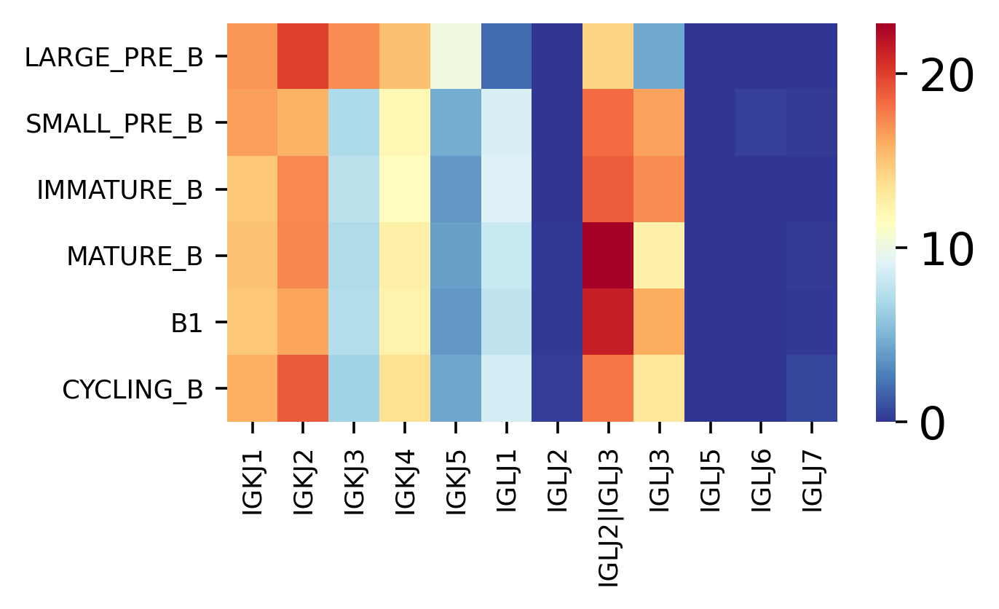

In [71]:
#np.random.seed(0)
fig, ax = plt.subplots(figsize=(BCR.shape[1]/3+0.2,BCR.shape[0]*0.375))
#sb.set_theme()
uniform_data = BCR
uniform_data=uniform_data.astype('float')
ax = sb.heatmap(uniform_data,cmap='RdYlBu_r')
_, xlabels = plt.xticks()
_, ylabels = plt.yticks()
ax.set_xticklabels(xlabels, size=8,rotation=90)
ax.set_yticklabels(ylabels, size=8,rotation=0)
plt.savefig(fig_path+'BCR_IGKJ_IGLJ.pdf',bbox_inches='tight');

### LR for IGHV, IGHJ, IGKV/LV, IGKJ/LJ - to find whether it is different btw B1 vs MATURE B, controlling for donor and organ

In [73]:
ct_select =['B1','MATURE_B'] 

IGHV

In [96]:
df = cdata.obs.loc[:,['v_call_genotyped_VDJ','j_call_VDJ','v_call_genotyped_VJ','j_call_VJ','anno_lvl_2_final_clean','donor','organ']]

In [97]:
# only leave B1 and mature B cells
df = df.loc[df['anno_lvl_2_final_clean'].isin(ct_select),:]

In [102]:
%%R -i df
for (i in 1:4) df[,i] <- as.character(df[,i]) # change from categorical to string
df[df=='nan']=NA # change all nan to NA, which will be counted as missing data
unique(df$v_call_genotyped_VJ) # check it's changed to NA

 [1] "IGKV4-1"                "IGLV3-10"               "IGLV3-1"               
 [4] "IGKV1D-39|IGKV1-39"     "IGLV1-44"               "IGKV3-11"              
 [7] "IGLV2-14"               "IGKV3-20"               "IGLV2-11"              
[10] "IGLV1-51"               "IGKV2-30"               "IGKV2D-29"             
[13] "IGLV6-57"               "IGLV3-19"               "IGLV4-69"              
[16] "IGLV1-47"               "IGLV9-49"               "IGKV2-28|IGKV2D-28"    
[19] "IGKV1-16"               "IGLV8-61"               "IGLV1-40"              
[22] "IGKV1D-33|IGKV1-33"     "IGLV3-25"               "IGLV3-21"              
[25] "IGKV3-15"               "IGLV2-23"               "IGKV2-24"              
[28] NA                       "IGKV1-5"                "IGLV10-54"             
[31] "IGKV1D-8"               "IGKV1-17"               "IGKV6D-41"             
[34] "IGKV1-8"                "IGKV1-9"                "IGLV7-43"              
[37] "IGKV1-27"               "IGKV1D-12

In [103]:
%%R -i df
results = NULL
for (i in 1:4){
    unique_genes = unique(df[,i]) 
    unique_genes = unique_genes[!is.na(unique_genes)] # get rid of na 
    pval <- logOddsRatio <- setNames(rep(0, length(unique_genes)), unique_genes)
    
    for (gene in unique_genes){
        is_gene <- df[,i] == gene
        fit <- glm(is_gene ~ anno_lvl_2_final_clean + organ + donor, data=df, family='binomial')
        logOddsRatio[gene] <- summary(fit)$coefficients['anno_lvl_2_final_cleanB1', 'Estimate']
        pval[gene] <- summary(fit)$coefficients['anno_lvl_2_final_cleanB1', 4]
    }
    results = rbind(results, as.data.frame(cbind(logOddsRatio, pval))) # concatenate all results

}

results

                        logOddsRatio         pval
IGHV3-33                2.918030e-01 6.479469e-03
IGHV1-18               -1.789648e-01 3.166263e-01
IGHV3-15               -1.163114e+00 4.026181e-10
IGHV6-1                -3.925834e-01 1.319013e-04
IGHV4-59                4.497888e-02 7.387793e-01
IGHV1-69               -3.705642e-01 6.809695e-03
IGHV3-53               -1.258911e-01 4.711742e-01
IGHV5-10-1             -2.697205e-01 3.143810e-01
IGHV3-23               -7.192843e-02 4.900387e-01
IGHV4-4                -1.830025e-01 3.388972e-01
IGHV4-39               -2.324135e-01 1.295784e-01
IGHV1-2                 6.461493e-03 9.313898e-01
IGHV3-7                -3.944846e-01 1.806722e-03
IGHV5-51                2.974672e-01 1.308132e-02
IGHV3-30                5.136212e-01 4.266763e-09
IGHV3-74               -5.982188e-01 7.051507e-02
IGHV4-31                1.157629e-01 5.575259e-01
IGHV3-21                3.216552e-01 1.874147e-03
IGHV1-3                 1.182973e-01 4.135779e-01


In [104]:
%%R 
results$adj_pval = p.adjust(results$pval, method = 'BH')
results[results$adj_pval<0.05,]

                    logOddsRatio         pval     adj_pval
IGHV3-33            2.918030e-01 6.479469e-03 3.613550e-02
IGHV3-15           -1.163114e+00 4.026181e-10 1.945987e-08
IGHV6-1            -3.925834e-01 1.319013e-04 1.125041e-03
IGHV1-69           -3.705642e-01 6.809695e-03 3.657059e-02
IGHV3-7            -3.944846e-01 1.806722e-03 1.181527e-02
IGHV3-30            5.136212e-01 4.266763e-09 1.546702e-07
IGHV3-21            3.216552e-01 1.874147e-03 1.181527e-02
IGHV1-2|IGHV1-46   -2.733409e+15 0.000000e+00 0.000000e+00
IGHV3-11           -4.616833e-01 8.320803e-03 4.308987e-02
IGHV1-8             8.613315e-01 1.864753e-15 1.351946e-13
IGHV2-26           -1.058488e+00 2.002409e-04 1.613052e-03
IGHV3-73            1.206742e+00 4.715461e-06 4.883870e-05
IGHJ4               2.253079e-01 2.554627e-06 3.367463e-05
IGHJ2              -2.045778e-01 5.716823e-03 3.315757e-02
IGHJ5|IGHJ4         9.831103e-01 2.576507e-04 1.867968e-03
IGKV4-1             5.256092e-01 1.297909e-08 3.136613e-

In [115]:
%%R 
write.csv(results, 'csv/b1_bcr_lr.csv')
# plot in BCR_volcano_plot.R

### BCR clonal expansion

In [128]:
bdata.obs["anno_lvl_2_final_clean"] = bdata.obs["anno_lvl_2_final_clean"].cat.reorder_categories(['IMMATURE_B','MATURE_B','B1','CYCLING_B','PLASMA_B'])

In [129]:
#bdata.obs['clonotype_size']=bdata.obs['clone_id_size']
bdata.obs['clonotype'] = bdata.obs['clone_id']

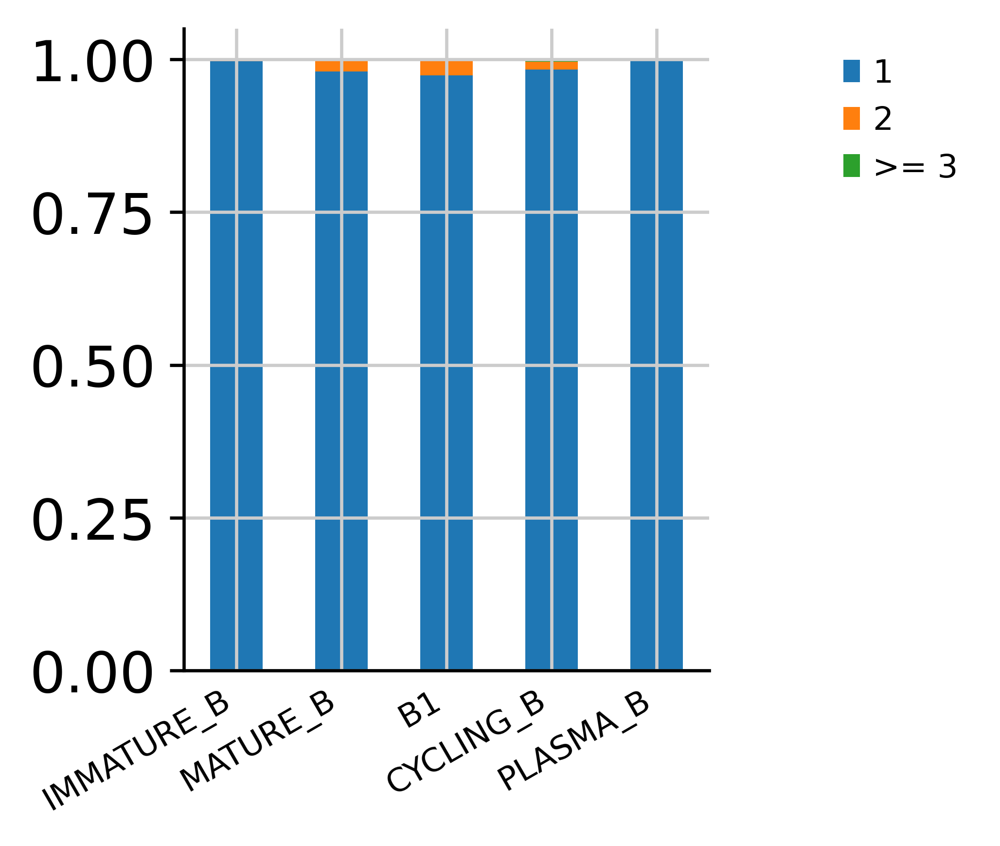

In [152]:
ir.pl.clonal_expansion(bdata, "anno_lvl_2_final_clean",fig_kws={'figsize': (3, 4), 'dpi': 300})
plt.savefig(fig_path+"BCR_clonal_size.pdf",bbox_inches='tight')

use chisq to calculate significance for clonal expansion

In [153]:
tbl_ce = pd.DataFrame(index = ['clonotype size =1','clonotype size >1'],
                     columns = bdata.obs['anno_lvl_2_final_clean'].cat.categories)
for cell in tbl_ce.columns:
    c = Counter(bdata[bdata.obs['anno_lvl_2_final_clean']==cell].obs['clonotype'])
    df = pd.DataFrame.from_dict(c, orient='index').reset_index()
    tbl_ce.loc['clonotype size =1',cell] = Counter(df[0])[1]
    tbl_ce.loc['clonotype size >1',cell] = sum(bdata.obs['anno_lvl_2_final_clean']==cell) - Counter(df[0])[1]

In [154]:
tbl_ce

,IMMATURE_B,MATURE_B,B1,CYCLING_B,PLASMA_B
clonotype size =1,923,7250,2306,704,22
clonotype size >1,2,137,51,11,0


In [155]:
# % cells that are of clonotype size >1
tbl_ce.loc['clonotype size >1'] / tbl_ce.loc['clonotype size =1'] * 100 

IMMATURE_B    0.216685
MATURE_B       1.88966
B1             2.21162
CYCLING_B       1.5625
PLASMA_B             0
dtype: object

In [156]:
# compare B1 and mature_B with chi-sq
observed = tbl_ce.loc[:,['MATURE_B','B1']]
_, pval, _, _ = sp.stats.chi2_contingency(observed=observed)
print(pval)
# conclusion: no significant difference 

0.38755512008481574


# ELISPOT results

In [131]:
eli = pd.read_csv('csv/ELISPOT_07082021_result.csv')

In [132]:
eli = eli.loc[~eli['well'].isin(['G3','G4','G5','G6']),:]

In [133]:
eli['frequency of antibody secreting spot'] = eli['spot_no'] / eli['cell_no'] *100
eli['spot_surface normalised by cell_no'] = eli['spot_surface'] / eli['cell_no']

In [134]:
for donor in ['F144','F145']:
    donorls = eli['donor']==donor
    select = (eli['donor']==donor) & (eli['sort_fraction']=='CCR10hi')
    mean_CCR10_ct = np.mean(eli.loc[select,'frequency of antibody secreting spot'])
    mean_CCR10_area = np.mean(eli.loc[select,'spot_surface normalised by cell_no'])
    
    eli.loc[donorls, 'normalised_spot_count'] = eli.loc[donorls, 'frequency of antibody secreting spot'] / mean_CCR10_ct *100
    eli.loc[donorls, 'normalised_spot_area'] = eli.loc[donorls, 'spot_surface normalised by cell_no'] / mean_CCR10_ct *100

In [135]:
eli

,well,spot_no,spot_surface,donor,sort_fraction,cell_no,frequency of antibody secreting spot,spot_surface normalised by cell_no,normalised_spot_count,normalised_spot_area
0,E3,238,2.453,F144,CCR10hi,7000,3.400000,0.000350,101.927195,0.010505
1,E4,229,2.419,F144,CCR10hi,7000,3.271429,0.000346,98.072805,0.010360
2,E5,169,1.769,F144,CCR10loCD27+CD43+,7000,2.414286,0.000253,72.376874,0.007576
3,E6,166,1.951,F144,CCR10loCD27+CD43+,7000,2.371429,0.000279,71.092077,0.008355
4,E7,80,0.895,F144,CCR10loCD27-CD43+,7000,1.142857,0.000128,34.261242,0.003833
5,E8,54,0.710,F144,CCR10loCD27-CD43+,7000,0.771429,0.000101,23.126338,0.003041
6,F3,32,0.327,F145,CCR10hi,7000,0.457143,0.000047,103.225806,0.010548
7,F4,30,0.383,F145,CCR10hi,7000,0.428571,0.000055,96.774194,0.012355
8,F5,22,0.267,F145,CCR10loCD27+CD43+,7000,0.314286,0.000038,70.967742,0.008613
9,F6,22,0.260,F145,CCR10loCD27+CD43+,7000,0.314286,0.000037,70.967742,0.008387


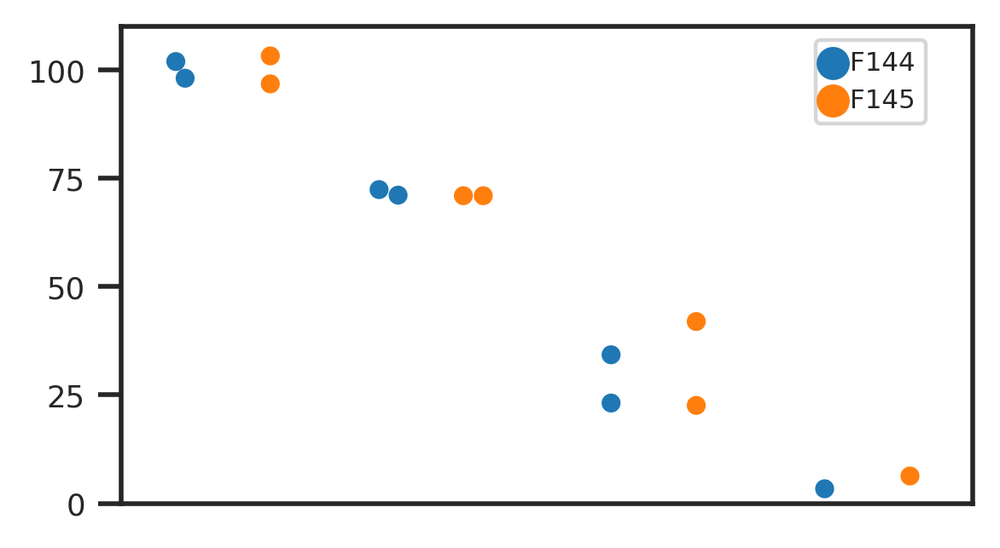

In [138]:
sb.set_style("ticks")
fig, ax = plt.subplots(figsize=(4,2.3))
s = sb.swarmplot(eli.loc[:,'sort_fraction'], eli.loc[:,'normalised_spot_count'], size=5,hue=eli.loc[:,'donor'],palette='tab10',dodge=True)

#g = sb.lineplot(data=eli, x='sort_fraction', y='normalised_spot_count', hue='donor')
s.legend(bbox_to_anchor=(0.8, 1), loc='upper left', fontsize='x-small')
s.set(ylabel='',xlabel='')
s.set(ylim=(0, 110))

#remove x ticks and tick labels
s.set(xticklabels=[])
s.tick_params(bottom=False)

#plt.xticks(fontsize=5)
plt.yticks(fontsize=8)
plt.savefig(fig_path+'elispot.pdf',bbox_inches='tight')

(array([-0.0001,  0.    ,  0.0001,  0.0002,  0.0003,  0.0004]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

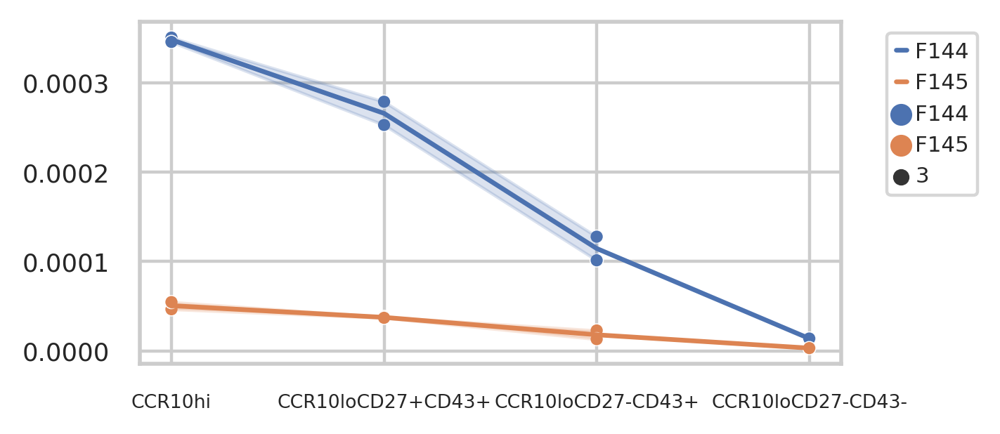

In [137]:
sb.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(4,2))
s = sb.scatterplot(eli.loc[:,'sort_fraction'], eli.loc[:,'spot_surface normalised by cell_no'], size=3,hue=eli.loc[:,'donor'])

g = sb.lineplot(data=eli, x='sort_fraction', y='spot_surface normalised by cell_no', hue='donor')
s.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='x-small')
s.set(ylabel='',xlabel='')
plt.xticks(fontsize=6)
plt.yticks(fontsize=8)
#plt.savefig('figures/elispot.svg',bbox_inches='tight')